In [ ]:
import os
import glob
from google.colab import drive
drive.mount('/content/gdrive')

In [ ]:
import os
os.environ['KAGGLE_CONFIG_DIR'] = "/content/gdrive/My Drive/ImagesCV"

In [ ]:
%cd /content/gdrive/My Drive/ImagesCV

In [ ]:
!pip install torch_optimizer

In [ ]:
!pip install -q --upgrade pip
!pip install -q six numpy scipy Pillow matplotlib scikit-image opencv-python imageio
!pip install -q --no-dependencies git+https://github.com/aleju/imgaug.git


In [ ]:
from sklearn.model_selection import train_test_split
import glob
import cv2
from torch.utils.data import Dataset,DataLoader
from torchvision import transforms
import torch
from matplotlib import pyplot as plt
import os
import imgaug as ia
from imgaug import augmenters as iaa
import numpy as np
import random
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch_optimizer as optim1
%matplotlib inline
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [ ]:
import imgaug.augmenters as iaa

### Read file paths

In [ ]:
students = glob.glob('/content/gdrive/My Drive/ImagesCV/*/*.*[!txt]')
students.remove('/content/gdrive/My Drive/ImagesCV/Zeev_Shavit/zeev 22.jpeg')
students.remove('/content/gdrive/My Drive/ImagesCV/Zeev_Shavit/zeev 19.jpeg')
students.remove('/content/gdrive/My Drive/ImagesCV/Aviv_Yampolsky/IMG_20200518_211458.jpg')
students.remove('/content/gdrive/My Drive/ImagesCV/Yigal_Diker/image2.jpeg')

In [ ]:
sometimes = lambda aug : iaa.Sometimes(0.5, aug)

In [ ]:
def make_augmantations(p = 1):
     return transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])])

### Make augmantations

In [ ]:
seq = iaa.Sequential(
    [
        iaa.SomeOf((0, 3),
            [
                iaa.OneOf([
                    iaa.GaussianBlur((0, 3)), # blur images with a sigma between 0 and 3.0
                    iaa.MedianBlur(k=(1, 3)), # blur image using local medians with kernel sizes between 2 and 7
                ]),
                 iaa.OneOf([
                    iaa.Rotate((-15,15))
                ]),
                iaa.OneOf([
                    iaa.Sharpen(alpha=(0.7, 1.0), lightness=(1, 1.5)), # sharpen images
                    iaa.Emboss(alpha=(0.5, 1.0), strength=(1, 1.0)), # emboss images
                    iaa.LinearContrast((0.5, 1.0), per_channel=0.3), # improve or worsen the contrast
                    iaa.Grayscale(alpha=(0.0, 1.0)),
                ]),
                iaa.OneOf([
                    iaa.Fliplr(0.8), # horizontally flip 20% of all images
                ]),
              
            ],
            random_order=True
        )
    ],
    random_order=True
)

In [ ]:
def load_datapaths(students):
    students_dict = {}
    i = 0
    for idx in range(len(students)):
        p = students[idx]
        label = p.split("/")[-2]
        if label not in students_dict.keys():
            students_dict[label] = []
            i += 1
        students_dict[label] += [p]
    
    return students_dict

In [ ]:
all_students = load_datapaths(students)

In [ ]:
def plot_data(students_dict): 
    i = 0
    plt.figure(figsize=[20,15])
    for label in students_dict:
        image = cv2.imread(students_dict[label][2])
        image = cv2.resize(image, (512,512))
        image = cv2.cvtColor(image, (cv2.COLOR_BGR2RGB))
        plt.subplot(5, 6, i + 1)
        plt.imshow(image, cmap = 'gray')
        plt.title(label)
        plt.axis('off')
        i +=1
    plt.show()


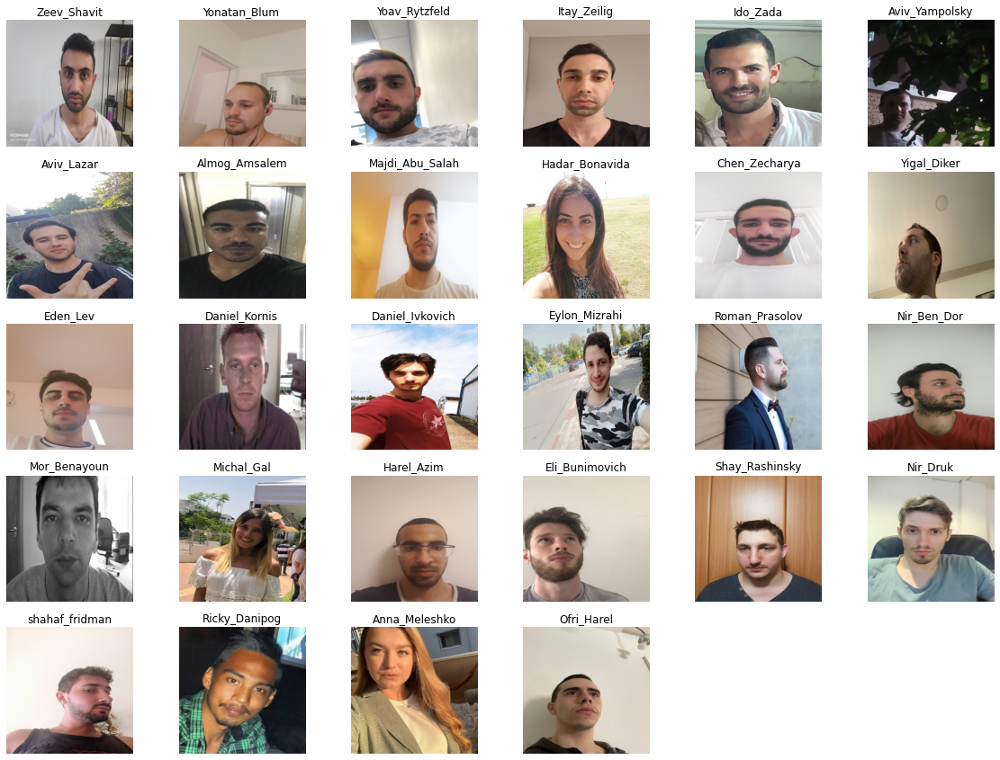

In [ ]:
plot_data(all_students)

In [ ]:
!wget https://github.com/thegopieffect/computer_vision/raw/master/CAFFE_DNN/res10_300x300_ssd_iter_140000.caffemodel
!wget https://raw.githubusercontent.com/thegopieffect/computer_vision/master/CAFFE_DNN/deploy.prototxt.txt

In [ ]:
from imutils import paths
import os
import argparse
detector = cv2.dnn.readNetFromCaffe("deploy.prototxt.txt", "res10_300x300_ssd_iter_140000.caffemodel")

### 1.1 Data Loader using augmantation class and face detect

In [ ]:
class MyDataSet(Dataset):
    def __init__(self, paths,labels_dict, train = True, transform = None, size = 224, test = False):
        self.paths = paths
        self.train = train
        self.transform = transform
        self.size = size
        self.labels_dict = labels_dict
        self.test = test

    def face_detect(self,img1):
        if img1 == '/content/gdrive/My Drive/ImagesCV/Yoav_Rytzfeld/18.jpg':
            image = cv2.imread(img1)
            image = cv2.rotate(imgg, cv2.ROTATE_90_CLOCKWISE)
        image = cv2.imread(img1)
        image = cv2.resize(image,(224,224))
        image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
        face = np.zeros_like(image)
        imageBlob = cv2.dnn.blobFromImage(image, 1.0, (224, 224))
        detector.setInput(imageBlob)
        detections = detector.forward()
        if len(detections) > 0:
            i = np.argmax(detections[0, 0, :, 2])
            confidence = detections[0, 0, i, 2]
            if confidence > 0.1:
                box =(detections[0, 0, i, 3:7] * 224).astype("int")
                box[box < 0] = 0
                (startX, startY, endX, endY) = box
                face = image[startY:endY, startX:endX]
                face = cv2.resize(face, (224,224))
        return face    


    def __getitem__(self, idx):
        p = self.paths[idx]
        label = p.split("/")[-2]
        image = self.face_detect(p)
        if self.train :
            image = seq.augment_image(image)   
        if self.transform != None:  
            image = transforms.ToPILImage()(image)
            image= self.transform(image)
        label = np.where(np.array(self.labels_dict) == label)
        if self.test:
            return image, label[0][0], p 
        else:
            return image, label[0][0] 

    def __len__(self):
        return len(self.paths)

### Split data for train, val and test

In [ ]:
students_t_v, test_students = train_test_split(students, test_size = 0.2, random_state = 2018) #train_test split using sklearn

In [ ]:
train_students, val_students = train_test_split(students_t_v, test_size = 0.1, random_state = 2018) #train_val split using sklearn

In [ ]:
print(len(train_students),len(test_students),len(val_students))

412 115 46


In [ ]:
train_transforms = make_augmantations()
test_transforms = make_augmantations()

train_set = MyDataSet(train_students, list(all_students.keys()), transform = train_transforms, train=True)
train_loader = torch.utils.data.DataLoader(train_set, batch_size = 16, shuffle=True, num_workers=8)

test_set = MyDataSet(test_students, list(all_students.keys()), transform = test_transforms, train=True, test= True)
test_loader = torch.utils.data.DataLoader(test_set, batch_size = 4, shuffle=True, num_workers=4)

val_set = MyDataSet(val_students, list(all_students.keys()), transform = test_transforms, train=True)
val_loader = torch.utils.data.DataLoader(val_set, batch_size = 16, shuffle=True , num_workers=8)

In [ ]:
def norm(img):
    img -=img.min()
    img/=img.max()
    return img

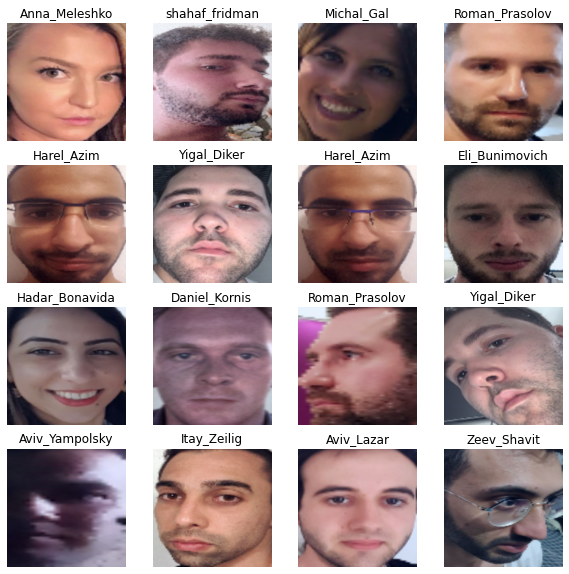

In [ ]:
batch = iter(train_loader)
img,label = next(batch)
img = img.numpy()
label = label
plt.figure(figsize=[10, 10])
for i, (row, t) in enumerate(zip(img, label)):
    plt.subplot(4, 4, i+1)
    im = row.transpose(1, 2, 0)
    plt.imshow(norm(im))
    plt.axis('off')
    plt.title(train_set.labels_dict[t])
plt.show()












![alt text](https://neurohive.io/wp-content/uploads/2018/11/vgg16-1-e1542731207177.png)

![alt text](https://neurohive.io/wp-content/uploads/2018/11/vgg16.png)

# VGG16 Model Implemantation 

In [ ]:
VGG16_Layers = [64, 64, 'M', 128, 128, 'M' ,256, 256, 256, 'M', 512, 512 ,512 , 'M', 512, 512 ,512 , 'M']

class VGG16(nn.Module): 
    def __init__(self , in_channels = 3, num_classes = 28):
        super(VGG16 ,self).__init__()
        self.in_channels = in_channels
        self.conv_layers = self.create_layers(VGG16_Layers)
        self.fcs = nn.Sequential(
            nn.Linear(512*7*7, 4096),
            nn.ReLU(),
            nn.Dropout(p = 0.2),
            nn.Linear(4096, 4096),
            nn.ReLU(),
            nn.Dropout(p = 0.2),
            nn.Linear(4096, num_classes)
            )

    def forward(self, x):
        x = self.conv_layers(x)
        x = x.reshape(x.shape[0], -1)
        x = self.fcs(x)
        return x

    def create_layers(self , arche):
        layers = []
        in_channels = self.in_channels
        for x in arche : 
            if type(x) == int : 
                out_channels = x 

                layers += [nn.Conv2d(in_channels=in_channels, out_channels=out_channels,
                                    kernel_size=(3,3), padding =(1,1)), 
                            nn.BatchNorm2d(x),
                            nn.ReLU()]
                in_channels = x
            elif x == 'M' :
                layers += [nn.MaxPool2d(kernel_size=(2,2))]

        return nn.Sequential(*layers)
 

In [ ]:
import torch.optim as optim
import torch_optimizer as optim1

In [ ]:
def optimizers(params,option , lr = 1e-4, weight_decay=0): 
    if option == 'adam':
        optimizer = optim.Adam(params, lr = lr , weight_decay=weight_decay)
    if option == 'radam':
        optimizer = optim1.RAdam(params,lr =lr,  weight_decay=weight_decay)
    return optimizer

In [ ]:
class MyFocalLoss(nn.Module):
  def __init__(self, alpha=0.25, gamma=4):
      super(MyFocalLoss, self).__init__()
      self.alpha  = alpha
      self.gamma  = gamma
      self.my_ce = nn.CrossEntropyLoss()

  def forward(self, input, target):
      p_t = torch.exp(-self.my_ce(input, target))
      loss = self.my_ce(input, target) * self.alpha * (torch.pow((1 - p_t), self.gamma))
      return loss


In [ ]:
import urllib.request as urlreq
import os
import matplotlib.pyplot as plt
from pylab import rcParams
from tqdm.auto import tqdm
import copy

In [ ]:
def training_loop(data_loader_train, data_loader_val ,model, optimizer, which_loss, scheduler):
    best_model_wts = copy.deepcopy(model.state_dict())
    loss_list = list()
    accur_lst = list()
    loss_list_val = list()
    accur_lst_val = list()
    loss_fn = which_loss
    loss_fn.to(device)  
    model.to(device)  
    best_acc = 0.0  
    try:   
        for e in tqdm(range(20)):
            model.train()
            train_loss = 0
            r_loss = 0
            train_acc = 0   
            total = 0
            hits = 0
            for i, sample in enumerate(tqdm(data_loader_train, desc = "train")):
                x_train, y_train = sample[0].to(device), sample[1].to(device)
                optimizer.zero_grad()
                output = model(x_train)
                loss = loss_fn(output, y_train.long())
                loss.backward()          
                optimizer.step() 
                total += y_train.size(0)
                r_loss+= loss.item() * x_train.size(0)
                _, pred = torch.max(output, 1)
                hits += (pred == y_train).sum().item()
            train_loss = r_loss / total
            train_acc = hits / total
            r_loss = 0
            total = 0
            hits = 0
            accur_lst.append(train_acc) 
            loss_list.append(train_loss) 
            model.eval()

            with torch.no_grad():
                for idx, sample1 in enumerate(data_loader_val, 0):
                    x_val, y_val = sample1[0].to(device), sample1[1].to(device)
                    output_val = model(x_val)
                    loss = loss_fn(output_val, y_val.long())
                    r_loss += loss.item() *x_val.size(0)
                    _, pred = torch.max(output_val, 1)
                    total += y_val.size(0)
                    hits += (pred == y_val).sum().item()
            val_loss = r_loss /total
            val_acc = hits / total
            print('Validation:[%d, %5d] train_loss: %.15f, train_accuracy: %f' %(e + 1, e + 1, train_loss, train_acc))
            print('Validation:[%d, %5d] val_loss: %.15f, val_accuracy: %f' %(e + 1, e + 1, val_loss, val_acc))
            loss_list_val.append(val_loss)
            accur_lst_val.append(val_acc)
                    
            if val_acc > best_acc:
                best_acc = val_acc
                best_model_wts = copy.deepcopy(model.state_dict()) 
            scheduler.step()
        model.load_state_dict(best_model_wts)
    except:
        torch.cuda.empty_cache()
        
    return loss_list, accur_lst , loss_list_val, accur_lst_val , model.cpu()

In [ ]:
import torch.optim.lr_scheduler as lr_scheduler 

In [ ]:
loss = nn.CrossEntropyLoss()
PATH = '/content/gdrive/My Drive/CV/models/'
vgg16_model = VGG16(in_channels= 3 , num_classes= 28)
optim = optimizers(vgg16_model.parameters(),'radam', lr = 1e-3, weight_decay=1e-5)
# FL_loss = MyFocalLoss(alpha=0.25 ,gamma=4)
scheduler = lr_scheduler.StepLR(optim, step_size=4, gamma=0.1)
loss_list1, accur_lst1 , val_loss_list, val_acc_list, best_model = training_loop(train_loader ,val_loader, vgg16_model , optim, loss, scheduler)
torch.save(best_model, PATH + 'vgg16')


Training:[1,     6] currnet_loss: 3.338256875673930, current_accuracy: 0.041667
Training:[1,    12] currnet_loss: 3.367416262626648, current_accuracy: 0.036458
Training:[1,    18] currnet_loss: 3.418930782212152, current_accuracy: 0.041667
Training:[1,    24] currnet_loss: 3.377618610858917, current_accuracy: 0.059896

Validation:[1,     3] train_loss: 3.360991820548345, train_accuracy: 0.060680
Validation:[1,     3] val_loss: 3.594151559083358, val_accuracy: 0.043478


Training:[2,     6] currnet_loss: 3.032618840535482, current_accuracy: 0.177083
Training:[2,    12] currnet_loss: 3.013246218363444, current_accuracy: 0.187500
Training:[2,    18] currnet_loss: 2.996527870496114, current_accuracy: 0.201389
Training:[2,    24] currnet_loss: 2.909752577543259, current_accuracy: 0.221354

Validation:[2,     3] train_loss: 2.895660953614318, train_accuracy: 0.223301
Validation:[2,     3] val_loss: 3.152287617973659, val_accuracy: 0.217391


Training:[3,     6] currnet_loss: 2.275708198547363, current_accuracy: 0.270833
Training:[3,    12] currnet_loss: 2.277041375637054, current_accuracy: 0.338542
Training:[3,    18] currnet_loss: 2.200728476047516, current_accuracy: 0.361111
Training:[3,    24] currnet_loss: 2.252430294950803, current_accuracy: 0.359375

Validation:[3,     3] train_loss: 2.263613905721498, train_accuracy: 0.364078
Validation:[3,     3] val_loss: 2.883330790892891, val_accuracy: 0.282609


Training:[4,     6] currnet_loss: 2.345422844092051, current_accuracy: 0.302083
Training:[4,    12] currnet_loss: 2.067775875329971, current_accuracy: 0.359375
Training:[4,    18] currnet_loss: 1.997856676578522, current_accuracy: 0.409722
Training:[4,    24] currnet_loss: 1.975464219848315, current_accuracy: 0.429688

Validation:[4,     3] train_loss: 1.976365529217766, train_accuracy: 0.432039
Validation:[4,     3] val_loss: 1.812734868215478, val_accuracy: 0.478261


Training:[5,     6] currnet_loss: 1.287632385889689, current_accuracy: 0.666667
Training:[5,    12] currnet_loss: 1.490045050779979, current_accuracy: 0.572917
Training:[5,    18] currnet_loss: 1.564666555987464, current_accuracy: 0.548611
Training:[5,    24] currnet_loss: 1.551383043328921, current_accuracy: 0.559896

Validation:[5,     3] train_loss: 1.560485589851453, train_accuracy: 0.558252
Validation:[5,     3] val_loss: 8.037300441576088, val_accuracy: 0.282609


Training:[6,     6] currnet_loss: 0.934621314207713, current_accuracy: 0.781250
Training:[6,    12] currnet_loss: 1.038711935281754, current_accuracy: 0.729167
Training:[6,    18] currnet_loss: 0.923608024915059, current_accuracy: 0.756944
Training:[6,    24] currnet_loss: 0.847521944592396, current_accuracy: 0.773438

Validation:[6,     3] train_loss: 0.835719553590978, train_accuracy: 0.781553
Validation:[6,     3] val_loss: 0.944826597752778, val_accuracy: 0.739130


Training:[7,     6] currnet_loss: 0.611067831516266, current_accuracy: 0.833333
Training:[7,    12] currnet_loss: 0.604727973540624, current_accuracy: 0.807292
Training:[7,    18] currnet_loss: 0.550935246878200, current_accuracy: 0.826389
Training:[7,    24] currnet_loss: 0.522546051690976, current_accuracy: 0.841146

Validation:[7,     3] train_loss: 0.506643068443224, train_accuracy: 0.847087
Validation:[7,     3] val_loss: 0.933516580125560, val_accuracy: 0.717391


Training:[8,     6] currnet_loss: 0.439740685125192, current_accuracy: 0.906250
Training:[8,    12] currnet_loss: 0.425433248281479, current_accuracy: 0.901042
Training:[8,    18] currnet_loss: 0.411515459418297, current_accuracy: 0.895833
Training:[8,    24] currnet_loss: 0.388218417142828, current_accuracy: 0.901042

Validation:[8,     3] train_loss: 0.377166197282597, train_accuracy: 0.905340
Validation:[8,     3] val_loss: 0.940744599570399, val_accuracy: 0.717391


Training:[9,     6] currnet_loss: 0.172854433457057, current_accuracy: 0.958333
Training:[9,    12] currnet_loss: 0.204944959531228, current_accuracy: 0.953125
Training:[9,    18] currnet_loss: 0.266865648329258, current_accuracy: 0.934028
Training:[9,    24] currnet_loss: 0.286811081071695, current_accuracy: 0.916667

Validation:[9,     3] train_loss: 0.275192976576611, train_accuracy: 0.922330
Validation:[9,     3] val_loss: 0.734936820424121, val_accuracy: 0.804348


Training:[10,     6] currnet_loss: 0.221809384723504, current_accuracy: 0.947917
Training:[10,    12] currnet_loss: 0.186556912958622, current_accuracy: 0.958333
Training:[10,    18] currnet_loss: 0.190378665924072, current_accuracy: 0.958333
Training:[10,    24] currnet_loss: 0.192455740024646, current_accuracy: 0.955729

Validation:[10,     3] train_loss: 0.201586881308880, train_accuracy: 0.949029
Validation:[10,     3] val_loss: 0.763225252213685, val_accuracy: 0.760870


Training:[11,     6] currnet_loss: 0.136714503169060, current_accuracy: 0.958333
Training:[11,    12] currnet_loss: 0.160768421987693, current_accuracy: 0.953125
Training:[11,    18] currnet_loss: 0.166345470481449, current_accuracy: 0.951389
Training:[11,    24] currnet_loss: 0.177820817256967, current_accuracy: 0.945312

Validation:[11,     3] train_loss: 0.180345114646027, train_accuracy: 0.946602
Validation:[11,     3] val_loss: 0.752017144275748, val_accuracy: 0.782609


Training:[12,     6] currnet_loss: 0.153083605070909, current_accuracy: 0.968750
Training:[12,    12] currnet_loss: 0.139957508693139, current_accuracy: 0.968750
Training:[12,    18] currnet_loss: 0.166597483058771, current_accuracy: 0.965278
Training:[12,    24] currnet_loss: 0.156824093932907, current_accuracy: 0.971354

Validation:[12,     3] train_loss: 0.156420369171402, train_accuracy: 0.970874
Validation:[12,     3] val_loss: 0.754602642162986, val_accuracy: 0.782609


Training:[13,     6] currnet_loss: 0.117096645136674, current_accuracy: 0.989583
Training:[13,    12] currnet_loss: 0.159625555078189, current_accuracy: 0.973958
Training:[13,    18] currnet_loss: 0.157967603868908, current_accuracy: 0.972222
Training:[13,    24] currnet_loss: 0.153977794572711, current_accuracy: 0.976562

Validation:[13,     3] train_loss: 0.147534703148656, train_accuracy: 0.978155
Validation:[13,     3] val_loss: 0.727520169123359, val_accuracy: 0.760870


Training:[14,     6] currnet_loss: 0.115157306194305, current_accuracy: 0.979167
Training:[14,    12] currnet_loss: 0.116895289470752, current_accuracy: 0.984375
Training:[14,    18] currnet_loss: 0.124974995851517, current_accuracy: 0.979167
Training:[14,    24] currnet_loss: 0.119873164842526, current_accuracy: 0.981771

Validation:[14,     3] train_loss: 0.116213880696343, train_accuracy: 0.983010
Validation:[14,     3] val_loss: 0.741102420765421, val_accuracy: 0.760870


Training:[15,     6] currnet_loss: 0.189030140638351, current_accuracy: 0.937500
Training:[15,    12] currnet_loss: 0.156312168886264, current_accuracy: 0.958333
Training:[15,    18] currnet_loss: 0.156930954092079, current_accuracy: 0.958333
Training:[15,    24] currnet_loss: 0.155966982866327, current_accuracy: 0.960938

Validation:[15,     3] train_loss: 0.152832570151218, train_accuracy: 0.963592
Validation:[15,     3] val_loss: 0.765158160873081, val_accuracy: 0.760870


Training:[16,     6] currnet_loss: 0.212120046218236, current_accuracy: 0.947917
Training:[16,    12] currnet_loss: 0.171280654768149, current_accuracy: 0.958333
Training:[16,    18] currnet_loss: 0.157259556154410, current_accuracy: 0.961806
Training:[16,    24] currnet_loss: 0.139271989464760, current_accuracy: 0.966146

Validation:[16,     3] train_loss: 0.140122316271356, train_accuracy: 0.966019
Validation:[16,     3] val_loss: 0.757767821135728, val_accuracy: 0.760870


Training:[17,     6] currnet_loss: 0.104283879200617, current_accuracy: 1.000000
Training:[17,    12] currnet_loss: 0.104529380798340, current_accuracy: 0.994792
Training:[17,    18] currnet_loss: 0.117131224936909, current_accuracy: 0.986111
Training:[17,    24] currnet_loss: 0.101739351948102, current_accuracy: 0.986979

Validation:[17,     3] train_loss: 0.103130139338160, train_accuracy: 0.985437
Validation:[17,     3] val_loss: 0.761543424233146, val_accuracy: 0.782609


Training:[18,     6] currnet_loss: 0.128285348415375, current_accuracy: 0.989583
Training:[18,    12] currnet_loss: 0.127079227318366, current_accuracy: 0.979167
Training:[18,    18] currnet_loss: 0.114227044913504, current_accuracy: 0.979167
Training:[18,    24] currnet_loss: 0.110231957087914, current_accuracy: 0.981771

Validation:[18,     3] train_loss: 0.107579801267791, train_accuracy: 0.983010
Validation:[18,     3] val_loss: 0.758275923521622, val_accuracy: 0.804348


Training:[19,     6] currnet_loss: 0.149739275376002, current_accuracy: 0.968750
Training:[19,    12] currnet_loss: 0.122642418990533, current_accuracy: 0.984375
Training:[19,    18] currnet_loss: 0.114031488696734, current_accuracy: 0.989583
Training:[19,    24] currnet_loss: 0.110792498414715, current_accuracy: 0.989583

Validation:[19,     3] train_loss: 0.112396836859509, train_accuracy: 0.990291
Validation:[19,     3] val_loss: 0.748186046662538, val_accuracy: 0.804348


Training:[20,     6] currnet_loss: 0.079245246946812, current_accuracy: 1.000000
Training:[20,    12] currnet_loss: 0.113704731067022, current_accuracy: 0.994792
Training:[20,    18] currnet_loss: 0.124306014842457, current_accuracy: 0.986111
Training:[20,    24] currnet_loss: 0.114354889839888, current_accuracy: 0.986979

Validation:[20,     3] train_loss: 0.117147662685913, train_accuracy: 0.985437
Validation:[20,     3] val_loss: 0.752130612083103, val_accuracy: 0.782609



/usr/local/lib/python3.6/dist-packages/torch/serialization.py:402: UserWarning: Couldn't retrieve source code for container of type VGG16. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


In [ ]:
vgg_load = torch.load(PATH + 'vgg16')

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sn
import pandas as pd

def show_scores(model, loader):
    correct = 0
    total = 0
    y_preds = np.array([])
    y_actual = np.array([])
    with torch.no_grad():
        for data in loader:
            images, labels = data[0].to(device),data[1].to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            y_preds = np.append(y_preds, predicted.cpu().detach().numpy())
            y_actual = np.append(y_actual, labels.cpu().detach().numpy())
    cm = confusion_matrix(y_actual, y_preds, labels=range(len(list(all_students.keys()))))
    df_cm = pd.DataFrame(cm, range(28), range(28))
    plt.figure(figsize = (10,7))
    sn.heatmap(df_cm, annot=True, cmap='Pastel1')
    plt.show()
    print('Accuracy of the network on the test images: %.3f %%' % ((correct / total)* 100))

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
 # def init_weights(m):
#     if type(m) == nn.Linear or type(m) == nn.Conv2d:
#         nn.init.xavier_uniform_(m.weight)
# model.apply(init_weights)

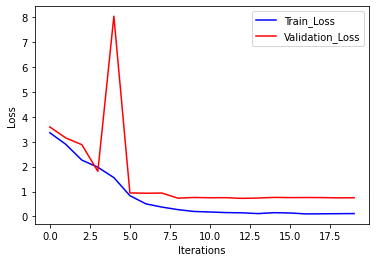

In [ ]:
plt.plot(loss_list1, 'b')
plt.plot(val_loss_list, 'r')
plt.legend(('Train_Loss', 'Validation_Loss'), loc='upper right')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

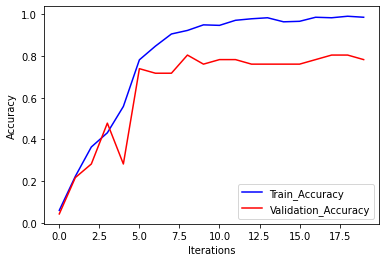

In [ ]:
plt.plot(accur_lst1,'b')
plt.plot(val_acc_list,'r')
plt.legend(('Train_Accuracy', 'Validation_Accuracy'), loc='lower right')
plt.xlabel('Iterations')
plt.ylabel('Accuracy')
plt.show()

In [ ]:
def test(data_loader_test, model, which_loss):
    loss_fn = which_loss
    loss_fn.to(device)  
    model.to(device)  
    hits_lst_pred = []
    hits_lst_label = []
    miss_lst_pred = []
    miss_lst_label = []
    try:   
        model.eval()
        r_loss = 0
        total = 0
        hits = 0
        test_loss = 0
        test_acc = 0
        with torch.no_grad():
            for i, sample in enumerate(tqdm(data_loader_test, desc = "test")):
                x_test, y_test, path = sample[0].to(device), sample[1].to(device), sample[2]
                output = model(x_test)
                loss = loss_fn(output, y_test.long())
                total += y_test.size(0)
                r_loss+= loss.item() * x_test.size(0)
                _, pred = torch.max(output, 1)
                hits += (pred == y_test).sum().item()
                for i in range(len(y_test)):
                    if pred[i] == y_test[i]:
                        hits_lst_pred.append(path[i])
                        hits_lst_label.append(y_test[i])
                    else:
                        miss_lst_pred.append(path[i])
                        miss_lst_label.append(pred[i])
            test_loss = r_loss / total
            test_acc = hits / total
    except:
        torch.cuda.empty_cache()
    return test_loss, test_acc, hits_lst_pred, hits_lst_label, miss_lst_pred, miss_lst_label



In [ ]:
loss, accur,  hits_list, hits_list_label, miss_pred_lst, miss_labels_lst =test(test_loader, best_model, FL_loss)

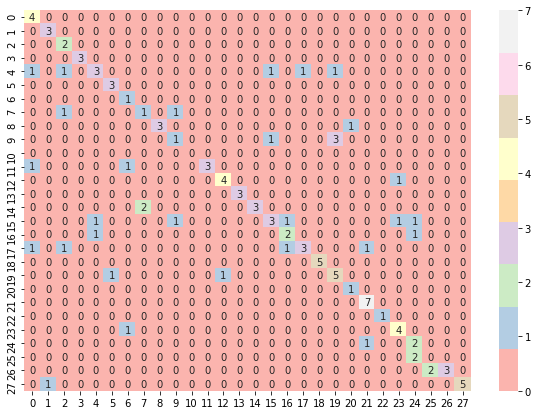

Accuracy of the network on the test images: 67.826 %


In [ ]:
show_scores(best_model.to(device), test_loader)

In [ ]:
def true_positives_false_negatives(hits_list , students_dict, labels):
    hit_counter = 0
    plt.figure(figsize = [20, 10])
    for idx,(p, a) in enumerate(zip(hits_list,labels)):
        hit_counter += 1
        pred_label = p.split("/")[-2]
        actual_label = int(a.cpu().numpy())
        image = cv2.imread(p)
        image = cv2.resize(image, (512,512))
        image = cv2.cvtColor(image, (cv2.COLOR_BGR2RGB))
        plt.subplot(2, 3, idx + 1)
        plt.imshow(image)
        plt.axis('off')
        plt.title(f"Predicted : {pred_label} | Actual : {list(students_dict.keys())[int(actual_label)]}")
        if hit_counter >= 6 :
            break
    plt.show()

# True positive

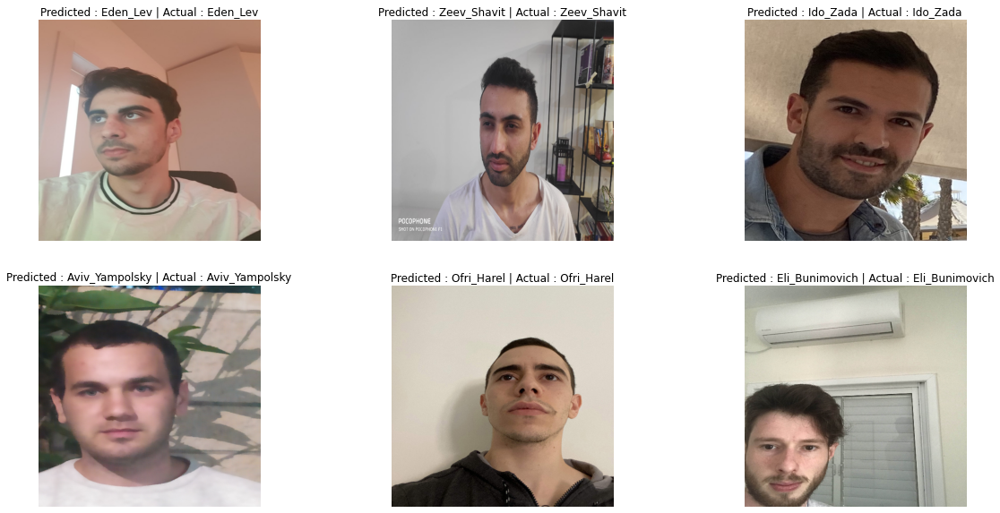

In [ ]:
true_positives_false_negatives(hits_list, all_students, hits_list_label)

# False Negative

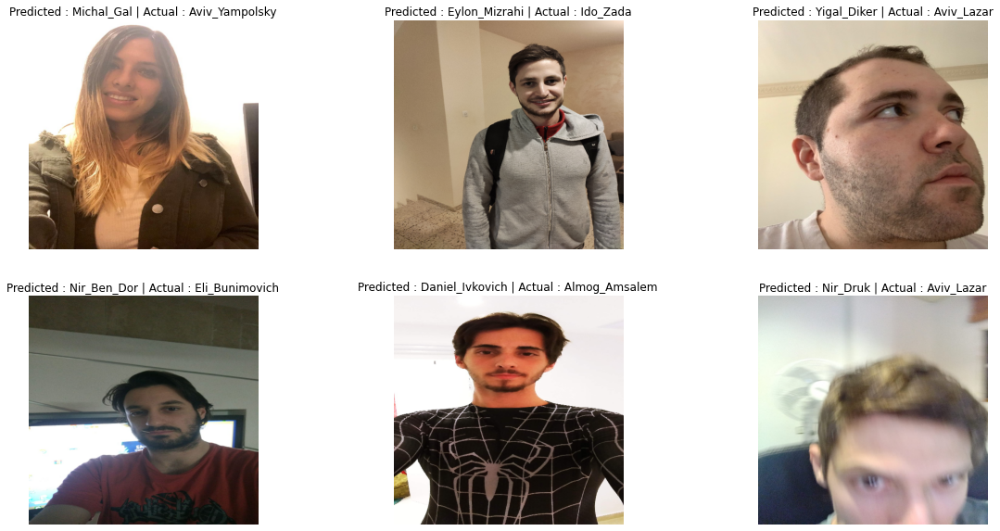

In [ ]:
true_positives_false_negatives(miss_pred_lst, all_students, miss_labels_lst)

In [ ]:
import torch.optim as optim
import torch_optimizer as optim1

In [ ]:
import torchvision.models as models

# ResNet

In [ ]:
PATH = '/content/gdrive/My Drive/CV/models/'
loss = nn.CrossEntropyLoss()
resnet = models.resnet50(pretrained= True)
resnet.fc.out_features = 28 #in = 2048
cur_optim = optimizers(resnet.parameters(),'adam', lr = 1e-4, weight_decay=0)
# FL_loss = MyFocalLoss(alpha=0.25 ,gamma=4)
scheduler = optim.lr_scheduler.StepLR(cur_optim, step_size=8, gamma=0.1)
loss_list1, accur_lst1 , val_loss_list, val_acc_list, best_model = training_loop(train_loader ,val_loader, resnet , cur_optim, loss, scheduler)
torch.save(best_model, PATH + 'resnet')


Validation:[1,     1] train_loss: 5.066505059455205, train_accuracy: 0.240291
Validation:[1,     1] val_loss: 2.014483830203181, val_accuracy: 0.630435



Validation:[2,     2] train_loss: 0.896737680273149, train_accuracy: 0.796117
Validation:[2,     2] val_loss: 0.816018959750300, val_accuracy: 0.804348



Validation:[3,     3] train_loss: 0.296036384927416, train_accuracy: 0.936893
Validation:[3,     3] val_loss: 0.547572072757327, val_accuracy: 0.847826



Validation:[4,     4] train_loss: 0.209652133358335, train_accuracy: 0.946602
Validation:[4,     4] val_loss: 0.395375395598619, val_accuracy: 0.913043



Validation:[5,     5] train_loss: 0.158289756517387, train_accuracy: 0.970874
Validation:[5,     5] val_loss: 0.268638838244521, val_accuracy: 0.956522



Validation:[6,     6] train_loss: 0.095152501957220, train_accuracy: 0.978155
Validation:[6,     6] val_loss: 0.430371673210807, val_accuracy: 0.891304



Validation:[7,     7] train_loss: 0.102588316190590, train_accuracy: 0.978155
Validation:[7,     7] val_loss: 0.421779101309569, val_accuracy: 0.913043



Validation:[8,     8] train_loss: 0.061151522998382, train_accuracy: 0.992718
Validation:[8,     8] val_loss: 0.295543637612592, val_accuracy: 0.934783



Validation:[9,     9] train_loss: 0.094748554950200, train_accuracy: 0.983010
Validation:[9,     9] val_loss: 0.345351655522118, val_accuracy: 0.934783



Validation:[10,    10] train_loss: 0.037985495029433, train_accuracy: 0.995146
Validation:[10,    10] val_loss: 0.199299481251965, val_accuracy: 0.978261



Validation:[11,    11] train_loss: 0.068358816061784, train_accuracy: 0.983010
Validation:[11,    11] val_loss: 0.318082361117653, val_accuracy: 0.913043



Validation:[12,    12] train_loss: 0.040347221985604, train_accuracy: 0.992718
Validation:[12,    12] val_loss: 0.267129178928292, val_accuracy: 0.934783



Validation:[13,    13] train_loss: 0.065376233137710, train_accuracy: 0.980583
Validation:[13,    13] val_loss: 0.282800850701397, val_accuracy: 0.934783



Validation:[14,    14] train_loss: 0.030937210955087, train_accuracy: 0.997573
Validation:[14,    14] val_loss: 0.235127592216367, val_accuracy: 0.956522



Validation:[15,    15] train_loss: 0.029116842895746, train_accuracy: 0.992718
Validation:[15,    15] val_loss: 0.326507073381673, val_accuracy: 0.934783



Validation:[16,    16] train_loss: 0.024220206214169, train_accuracy: 0.997573
Validation:[16,    16] val_loss: 0.262013380942137, val_accuracy: 0.956522



Validation:[17,    17] train_loss: 0.047518082180069, train_accuracy: 0.987864
Validation:[17,    17] val_loss: 0.297648978622063, val_accuracy: 0.934783



Validation:[18,    18] train_loss: 0.044587105223276, train_accuracy: 0.990291
Validation:[18,    18] val_loss: 0.308693305629751, val_accuracy: 0.956522



Validation:[19,    19] train_loss: 0.052408530304516, train_accuracy: 0.990291
Validation:[19,    19] val_loss: 0.193079325168029, val_accuracy: 0.978261



Validation:[20,    20] train_loss: 0.046035874164799, train_accuracy: 0.987864
Validation:[20,    20] val_loss: 0.296869920566678, val_accuracy: 0.934783



In [ ]:
loss, accur,  hits_list, hits_list_label, miss_pred_lst, miss_labels_lst = test(test_loader, best_model, FL_loss)

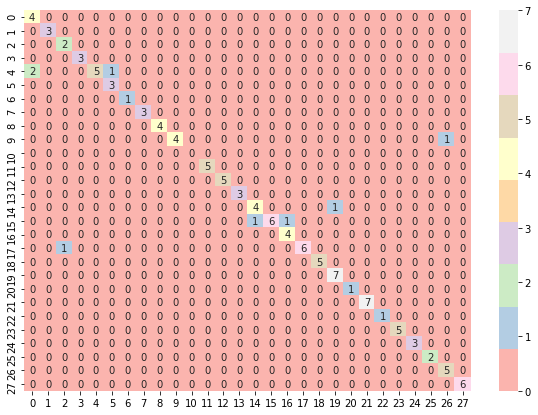

Accuracy of the network on the test images: 93.043 %


In [ ]:
show_scores(best_model.to(device), test_loader)

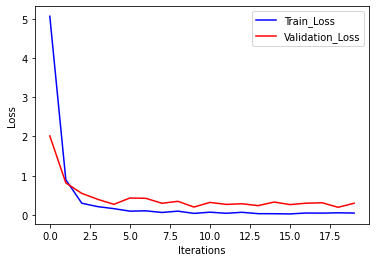

In [ ]:
plt.plot(loss_list1, 'b')
plt.plot(val_loss_list, 'r')
plt.legend(('Train_Loss', 'Validation_Loss'), loc='upper right')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

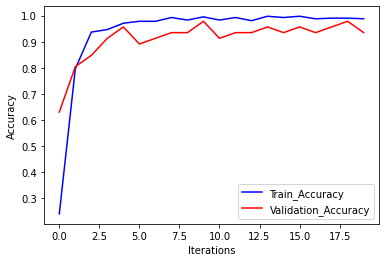

In [ ]:
plt.plot(accur_lst1,'b')
plt.plot(val_acc_list,'r')
plt.legend(('Train_Accuracy', 'Validation_Accuracy'), loc='lower right')
plt.xlabel('Iterations')
plt.ylabel('Accuracy')
plt.show()

# True Positives

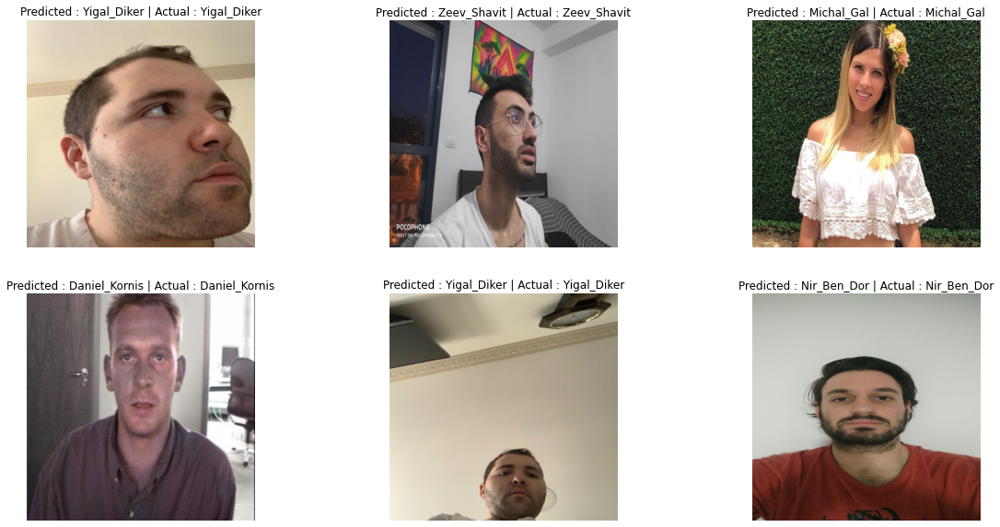

In [ ]:
true_positives_false_negatives(hits_list, all_students, hits_list_label)

# False Negative

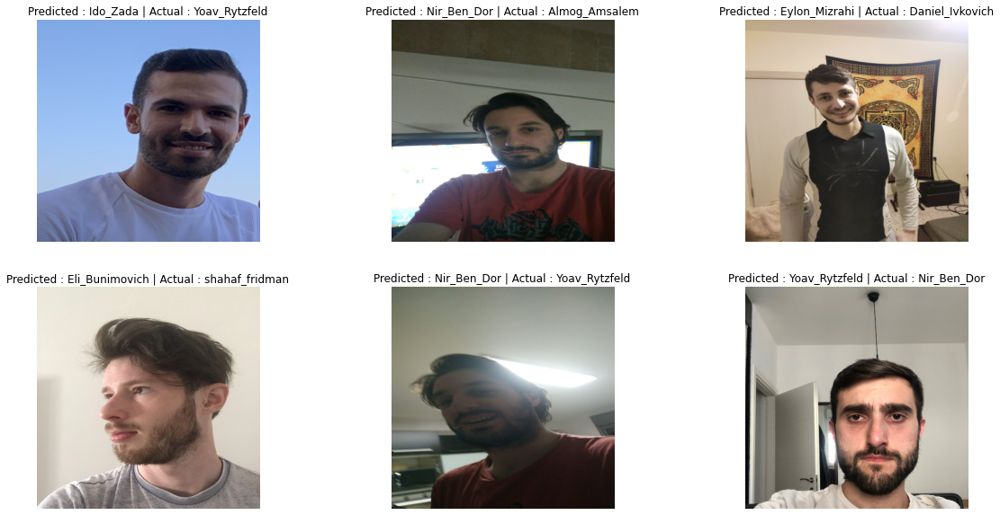

In [ ]:
true_positives_false_negatives(miss_pred_lst, all_students, miss_labels_lst)

# DenseNet

In [ ]:
# loss = nn.CrossEntropyLoss()
PATH = '/content/gdrive/My Drive/CV/models/'
densenet = models.densenet161(pretrained= True)
densenet.classifier.out_features = 28 #in = 2208
cur_optim = optimizers(densenet.parameters(),'adam', lr = 1e-3, weight_decay=1e-5)
FL_loss = MyFocalLoss(alpha=0.25 ,gamma=4)
scheduler = optim.lr_scheduler.StepLR(cur_optim, step_size=7, gamma=0.1)
loss_list1, accur_lst1 , val_loss_list, val_acc_list, best_model = training_loop(train_loader ,val_loader, densenet , cur_optim, FL_loss, scheduler)
torch.save(best_model, PATH + 'densenet')


Validation:[1,     1] train_loss: 0.713767544447797, train_accuracy: 0.279126
Validation:[1,     1] val_loss: 1.038901971734088, val_accuracy: 0.152174



Validation:[2,     2] train_loss: 0.068286112511928, train_accuracy: 0.657767
Validation:[2,     2] val_loss: 0.250065504856732, val_accuracy: 0.608696



Validation:[3,     3] train_loss: 0.018100105605802, train_accuracy: 0.820388
Validation:[3,     3] val_loss: 0.011258829870950, val_accuracy: 0.869565



Validation:[4,     4] train_loss: 0.003254680891737, train_accuracy: 0.885922
Validation:[4,     4] val_loss: 0.004691847284804, val_accuracy: 0.826087



Validation:[5,     5] train_loss: 0.000543221616901, train_accuracy: 0.944175
Validation:[5,     5] val_loss: 0.001678688152384, val_accuracy: 0.913043



Validation:[6,     6] train_loss: 0.000182845888675, train_accuracy: 0.961165
Validation:[6,     6] val_loss: 0.001100684100453, val_accuracy: 0.934783



Validation:[7,     7] train_loss: 0.000023288528682, train_accuracy: 0.983010
Validation:[7,     7] val_loss: 0.001623394661178, val_accuracy: 0.891304



Validation:[8,     8] train_loss: 0.000064604799169, train_accuracy: 0.958738
Validation:[8,     8] val_loss: 0.001199200975506, val_accuracy: 0.913043



Validation:[9,     9] train_loss: 0.000113275434773, train_accuracy: 0.975728
Validation:[9,     9] val_loss: 0.000500827004662, val_accuracy: 0.934783



Validation:[10,    10] train_loss: 0.000188654166671, train_accuracy: 0.956311
Validation:[10,    10] val_loss: 0.001001508750683, val_accuracy: 0.913043



Validation:[11,    11] train_loss: 0.000034354576971, train_accuracy: 0.975728
Validation:[11,    11] val_loss: 0.000680731794356, val_accuracy: 0.934783



Validation:[12,    12] train_loss: 0.000075634424153, train_accuracy: 0.978155
Validation:[12,    12] val_loss: 0.000252174612125, val_accuracy: 0.956522



Validation:[13,    13] train_loss: 0.000062922328490, train_accuracy: 0.968447
Validation:[13,    13] val_loss: 0.000531201407759, val_accuracy: 0.934783



Validation:[14,    14] train_loss: 0.000053305271551, train_accuracy: 0.961165
Validation:[14,    14] val_loss: 0.000775329538674, val_accuracy: 0.913043



Validation:[15,    15] train_loss: 0.000034566729437, train_accuracy: 0.985437
Validation:[15,    15] val_loss: 0.001856022205610, val_accuracy: 0.869565



Validation:[16,    16] train_loss: 0.000036199958602, train_accuracy: 0.963592
Validation:[16,    16] val_loss: 0.003187411606192, val_accuracy: 0.956522



Validation:[17,    17] train_loss: 0.000043518386181, train_accuracy: 0.973301
Validation:[17,    17] val_loss: 0.001915020087282, val_accuracy: 0.934783



Validation:[18,    18] train_loss: 0.000062291849661, train_accuracy: 0.973301
Validation:[18,    18] val_loss: 0.001050196207055, val_accuracy: 0.934783



Validation:[19,    19] train_loss: 0.000099133611251, train_accuracy: 0.978155
Validation:[19,    19] val_loss: 0.002932633910424, val_accuracy: 0.826087



Validation:[20,    20] train_loss: 0.000196147459658, train_accuracy: 0.973301
Validation:[20,    20] val_loss: 0.003059792715763, val_accuracy: 0.913043



In [ ]:
loss, accur,  hits_list, hits_list_label, miss_pred_lst, miss_labels_lst = test(test_loader, best_model, FL_loss)

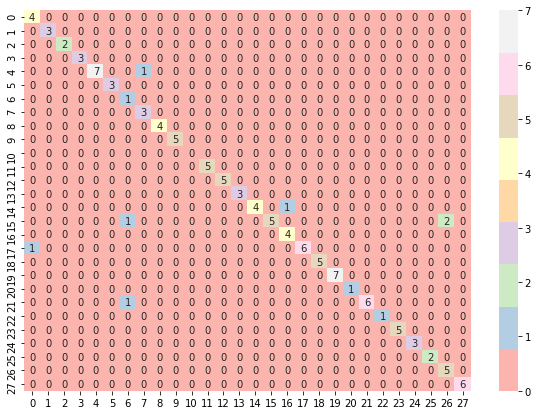

Accuracy of the network on the test images: 93.913 %


In [ ]:
show_scores(best_model.to(device), test_loader)

#  DenseNet- True Positive

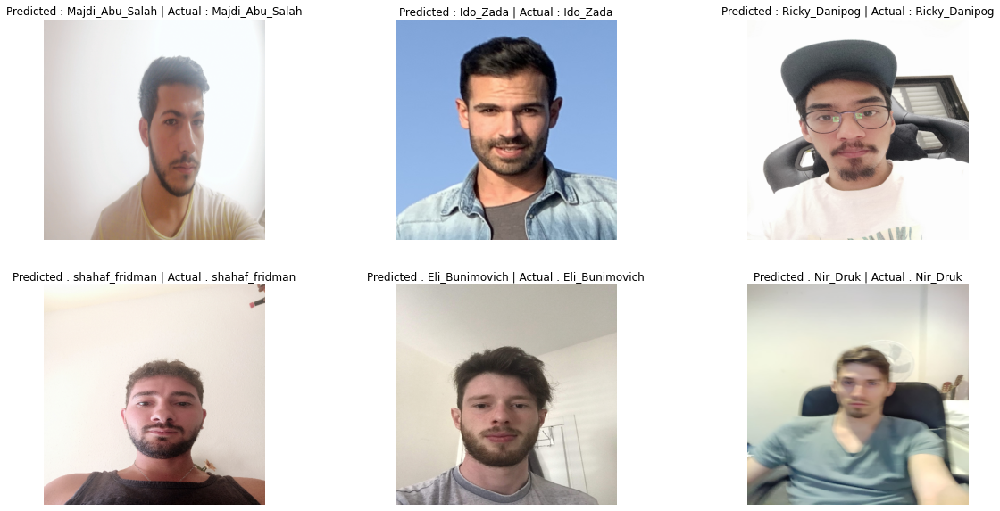

In [ ]:
true_positives_false_negatives(hits_list, all_students, hits_list_label)

# DenseNet - False Negative

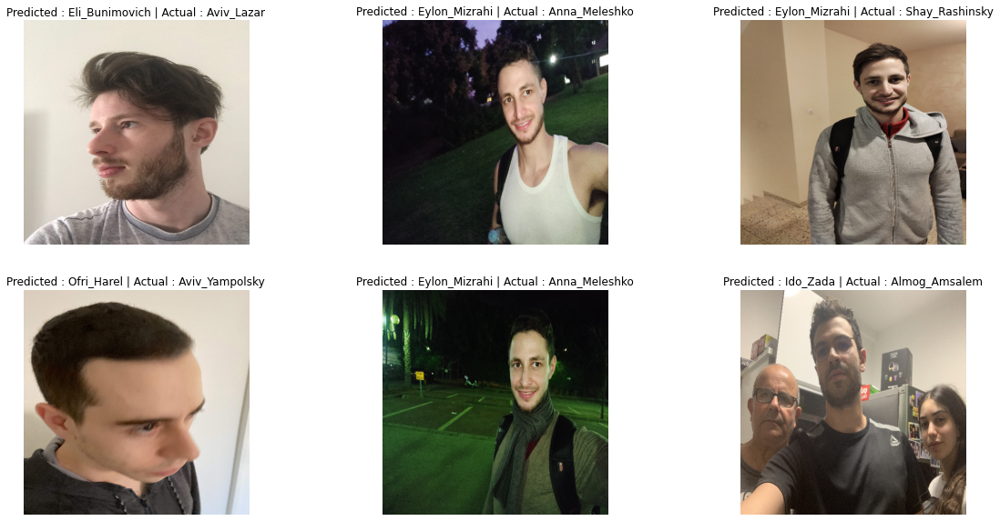

In [ ]:
true_positives_false_negatives(miss_pred_lst, all_students, miss_labels_lst)

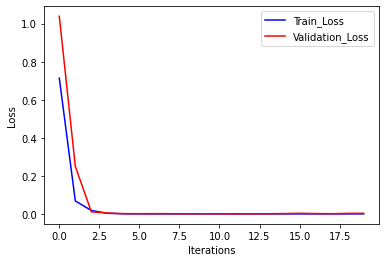

In [ ]:
plt.plot(loss_list1, 'b')
plt.plot(val_loss_list, 'r')
plt.legend(('Train_Loss', 'Validation_Loss'), loc='upper right')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

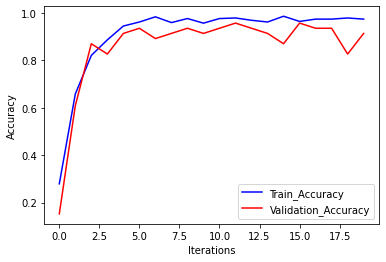

In [ ]:
plt.plot(accur_lst1,'b')
plt.plot(val_acc_list,'r')
plt.legend(('Train_Accuracy', 'Validation_Accuracy'), loc='lower right')
plt.xlabel('Iterations')
plt.ylabel('Accuracy')
plt.show()

# GoogleNet

In [ ]:
PATH = '/content/gdrive/My Drive/CV/models/'
loss = nn.CrossEntropyLoss()
googlenet = models.googlenet(pretrained= True)
googlenet.fc.out_features = 28 #in = 1024
cur_optim = optimizers(googlenet.parameters(),'adam', lr = 1e-3, weight_decay=1e-4)
FL_loss = MyFocalLoss(alpha=0.25 ,gamma=4)
scheduler = optim.lr_scheduler.StepLR(cur_optim, step_size=4, gamma=0.1)
loss_list1, accur_lst1 , val_loss_list, val_acc_list, best_model = training_loop(train_loader ,val_loader, googlenet , cur_optim, loss, scheduler)
torch.save(best_model, PATH + 'googlenet')

Downloading: "https://download.pytorch.org/models/googlenet-1378be20.pth" to /root/.cache/torch/checkpoints/googlenet-1378be20.pth



Validation:[1,     1] train_loss: 2.916650083458539, train_accuracy: 0.388350
Validation:[1,     1] val_loss: 2.409490699353425, val_accuracy: 0.478261



Validation:[2,     2] train_loss: 0.771983600357204, train_accuracy: 0.774272
Validation:[2,     2] val_loss: 2.046087353125862, val_accuracy: 0.565217



Validation:[3,     3] train_loss: 0.457080532335541, train_accuracy: 0.888350
Validation:[3,     3] val_loss: 0.609762583089911, val_accuracy: 0.804348



Validation:[4,     4] train_loss: 0.306478798823449, train_accuracy: 0.919903
Validation:[4,     4] val_loss: 0.393343845139379, val_accuracy: 0.826087



Validation:[5,     5] train_loss: 0.148140647023627, train_accuracy: 0.953883
Validation:[5,     5] val_loss: 0.270172633554624, val_accuracy: 0.934783



Validation:[6,     6] train_loss: 0.113689560913345, train_accuracy: 0.970874
Validation:[6,     6] val_loss: 0.408081592425056, val_accuracy: 0.869565



Validation:[7,     7] train_loss: 0.063621563827890, train_accuracy: 0.990291
Validation:[7,     7] val_loss: 0.292352678335231, val_accuracy: 0.891304



Validation:[8,     8] train_loss: 0.045217838138342, train_accuracy: 0.987864
Validation:[8,     8] val_loss: 0.268420333447664, val_accuracy: 0.934783



Validation:[9,     9] train_loss: 0.038363681292360, train_accuracy: 0.990291
Validation:[9,     9] val_loss: 0.219521355369817, val_accuracy: 0.934783



Validation:[10,    10] train_loss: 0.040803356114232, train_accuracy: 0.992718
Validation:[10,    10] val_loss: 0.231586414834727, val_accuracy: 0.956522



Validation:[11,    11] train_loss: 0.050296160799352, train_accuracy: 0.987864
Validation:[11,    11] val_loss: 0.207340695287870, val_accuracy: 0.934783



Validation:[12,    12] train_loss: 0.043931700687096, train_accuracy: 0.992718
Validation:[12,    12] val_loss: 0.219203079524248, val_accuracy: 0.956522



Validation:[13,    13] train_loss: 0.033433326248767, train_accuracy: 0.995146
Validation:[13,    13] val_loss: 0.253275548958260, val_accuracy: 0.891304



Validation:[14,    14] train_loss: 0.032344336657631, train_accuracy: 0.997573
Validation:[14,    14] val_loss: 0.272471115640972, val_accuracy: 0.913043



Validation:[15,    15] train_loss: 0.026125992390607, train_accuracy: 0.997573
Validation:[15,    15] val_loss: 0.315188882143601, val_accuracy: 0.891304



Validation:[16,    16] train_loss: 0.040189913030967, train_accuracy: 0.995146
Validation:[16,    16] val_loss: 0.257911122363547, val_accuracy: 0.934783



Validation:[17,    17] train_loss: 0.047256041499018, train_accuracy: 0.987864
Validation:[17,    17] val_loss: 0.357625857481490, val_accuracy: 0.913043



Validation:[18,    18] train_loss: 0.047284375116663, train_accuracy: 0.985437
Validation:[18,    18] val_loss: 0.220592983390974, val_accuracy: 0.956522



Validation:[19,    19] train_loss: 0.056223789456038, train_accuracy: 0.985437
Validation:[19,    19] val_loss: 0.224618462116822, val_accuracy: 0.956522



Validation:[20,    20] train_loss: 0.037591737455426, train_accuracy: 0.990291
Validation:[20,    20] val_loss: 0.231039768975714, val_accuracy: 0.934783



In [ ]:
loss, accur,  hits_list, hits_list_label, miss_pred_lst, miss_labels_lst = test(test_loader, best_model, FL_loss)

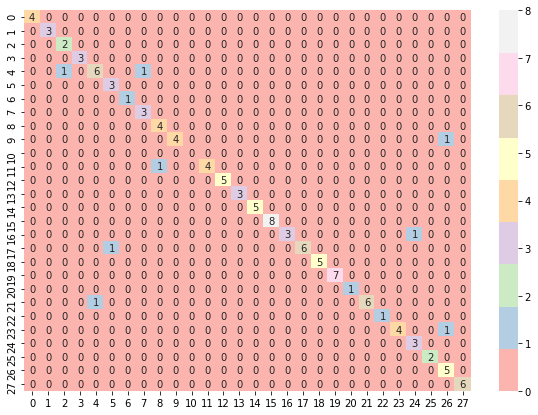

Accuracy of the network on the test images: 93.043 %


In [ ]:
show_scores(best_model.to(device), test_loader)

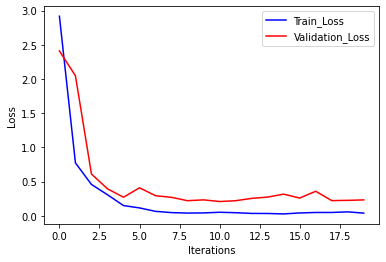

In [ ]:
plt.plot(loss_list1, 'b')
plt.plot(val_loss_list, 'r')
plt.legend(('Train_Loss', 'Validation_Loss'), loc='upper right')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

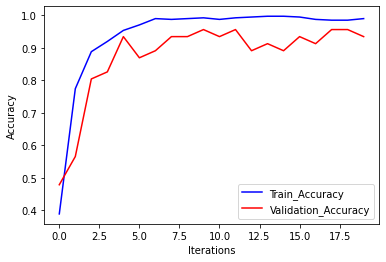

In [ ]:
plt.plot(accur_lst1,'b')
plt.plot(val_acc_list,'r')
plt.legend(('Train_Accuracy', 'Validation_Accuracy'), loc='lower right')
plt.xlabel('Iterations')
plt.ylabel('Accuracy')
plt.show()

# GoogleNet - True Positive

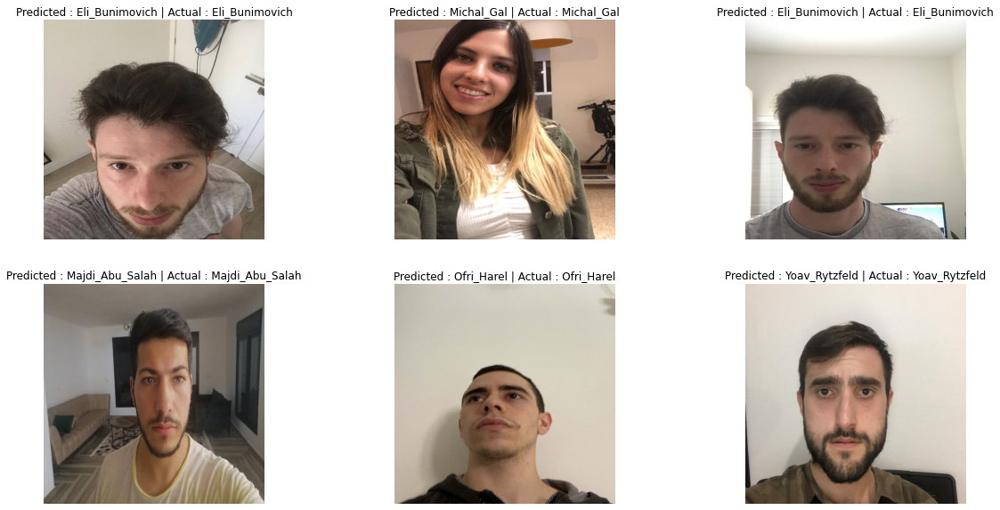

In [ ]:
true_positives_false_negatives(hits_list, all_students, hits_list_label)

# GoogleNet - False Negative

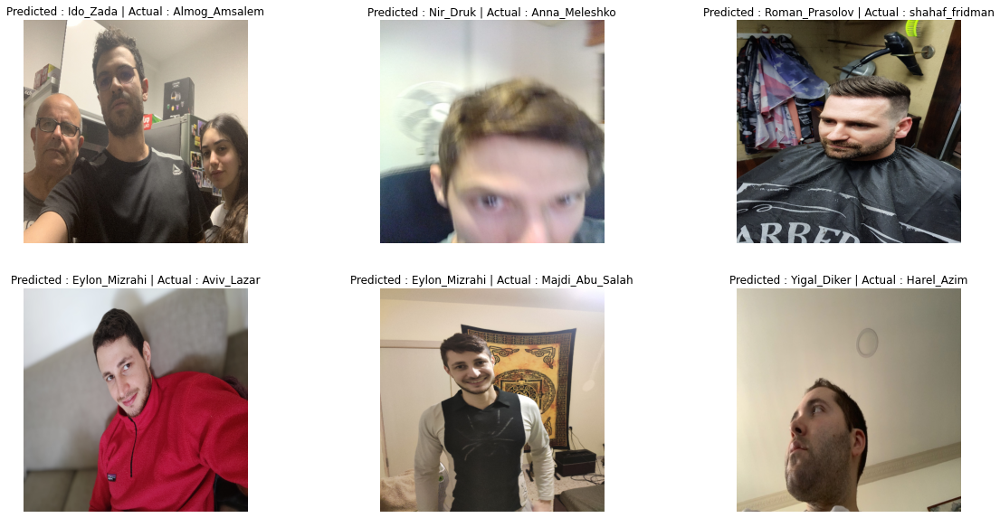

In [ ]:
true_positives_false_negatives(miss_pred_lst, all_students, miss_labels_lst)

# ResNext

In [ ]:
# loss = nn.CrossEntropyLoss()
PATH = '/content/gdrive/My Drive/CV/models/'
resnext50 = models.resnext50_32x4d(pretrained= True)
resnext50.fc.out_features = 28 # in = 2048
cur_optim = optimizers(resnext50.parameters(),'adam', lr = 1e-4, weight_decay=1e-5)
FL_loss = MyFocalLoss(alpha=1 ,gamma=4)
scheduler = optim.lr_scheduler.StepLR(cur_optim, step_size=8, gamma=0.1)
loss_list1, accur_lst1 , val_loss_list, val_acc_list, best_model = training_loop(train_loader ,val_loader, resnext50 , cur_optim, FL_loss, scheduler)
torch.save(best_model, PATH + 'resnext50')

Downloading: "https://download.pytorch.org/models/resnext50_32x4d-7cdf4587.pth" to /root/.cache/torch/checkpoints/resnext50_32x4d-7cdf4587.pth



Validation:[1,     1] train_loss: 4.450849356003178, train_accuracy: 0.291262
Validation:[1,     1] val_loss: 0.544492888061897, val_accuracy: 0.760870



Validation:[2,     2] train_loss: 0.078385215426978, train_accuracy: 0.851942
Validation:[2,     2] val_loss: 0.017258411799760, val_accuracy: 0.847826



Validation:[3,     3] train_loss: 0.010140892091549, train_accuracy: 0.939320
Validation:[3,     3] val_loss: 0.025254409922206, val_accuracy: 0.891304



Validation:[4,     4] train_loss: 0.003907305159010, train_accuracy: 0.958738
Validation:[4,     4] val_loss: 0.012354079870689, val_accuracy: 0.913043



Validation:[5,     5] train_loss: 0.002520690551411, train_accuracy: 0.953883
Validation:[5,     5] val_loss: 0.020802462834225, val_accuracy: 0.869565



Validation:[6,     6] train_loss: 0.001972526098121, train_accuracy: 0.961165
Validation:[6,     6] val_loss: 0.010263655152496, val_accuracy: 0.891304



Validation:[7,     7] train_loss: 0.005390765011714, train_accuracy: 0.936893
Validation:[7,     7] val_loss: 0.001957424345639, val_accuracy: 0.913043



Validation:[8,     8] train_loss: 0.003200899297412, train_accuracy: 0.963592
Validation:[8,     8] val_loss: 0.018733900445311, val_accuracy: 0.869565



Validation:[9,     9] train_loss: 0.000497577048144, train_accuracy: 0.968447
Validation:[9,     9] val_loss: 0.006266918875158, val_accuracy: 0.934783



Validation:[10,    10] train_loss: 0.001188691030372, train_accuracy: 0.970874
Validation:[10,    10] val_loss: 0.033459282878144, val_accuracy: 0.891304



Validation:[11,    11] train_loss: 0.000597354705644, train_accuracy: 0.953883
Validation:[11,    11] val_loss: 0.010258937993532, val_accuracy: 0.891304



Validation:[12,    12] train_loss: 0.000670913769477, train_accuracy: 0.973301
Validation:[12,    12] val_loss: 0.012157565888154, val_accuracy: 0.891304



Validation:[13,    13] train_loss: 0.000683899804499, train_accuracy: 0.978155
Validation:[13,    13] val_loss: 0.016682233094521, val_accuracy: 0.891304



Validation:[14,    14] train_loss: 0.002489731929145, train_accuracy: 0.980583
Validation:[14,    14] val_loss: 0.006498350539123, val_accuracy: 0.913043



Validation:[15,    15] train_loss: 0.000647189043059, train_accuracy: 0.973301
Validation:[15,    15] val_loss: 0.005757981465491, val_accuracy: 0.913043



Validation:[16,    16] train_loss: 0.000524794602642, train_accuracy: 0.968447
Validation:[16,    16] val_loss: 0.010217165554185, val_accuracy: 0.891304



Validation:[17,    17] train_loss: 0.000835537110840, train_accuracy: 0.963592
Validation:[17,    17] val_loss: 0.008442571606872, val_accuracy: 0.934783



Validation:[18,    18] train_loss: 0.000308438167832, train_accuracy: 0.975728
Validation:[18,    18] val_loss: 0.004516351147152, val_accuracy: 0.891304



Validation:[19,    19] train_loss: 0.001464525797581, train_accuracy: 0.970874
Validation:[19,    19] val_loss: 0.014126229201160, val_accuracy: 0.891304



Validation:[20,    20] train_loss: 0.000559106759988, train_accuracy: 0.978155
Validation:[20,    20] val_loss: 0.014733299213138, val_accuracy: 0.913043



In [ ]:
loss, accur,  hits_list, hits_list_label, miss_pred_lst, miss_labels_lst = test(test_loader, best_model, FL_loss)

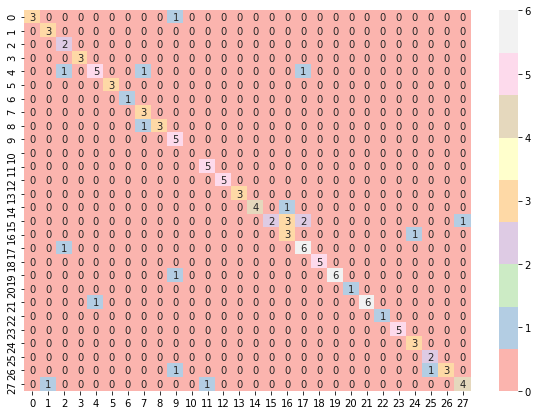

Accuracy of the network on the test images: 82.609 %


In [ ]:
show_scores(best_model.to(device), test_loader)

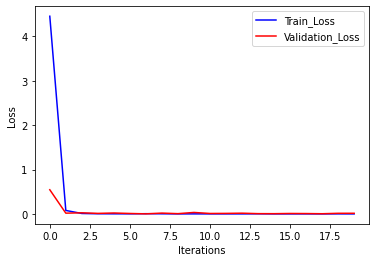

In [ ]:
plt.plot(loss_list1, 'b')
plt.plot(val_loss_list, 'r')
plt.legend(('Train_Loss', 'Validation_Loss'), loc='upper right')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

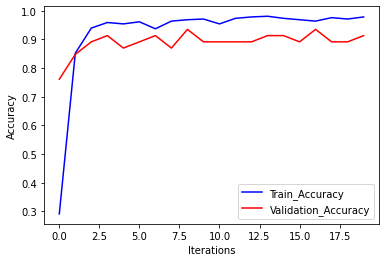

In [ ]:
plt.plot(accur_lst1,'b')
plt.plot(val_acc_list,'r')
plt.legend(('Train_Accuracy', 'Validation_Accuracy'), loc='lower right')
plt.xlabel('Iterations')
plt.ylabel('Accuracy')
plt.show()

#  ResNext- True Positive


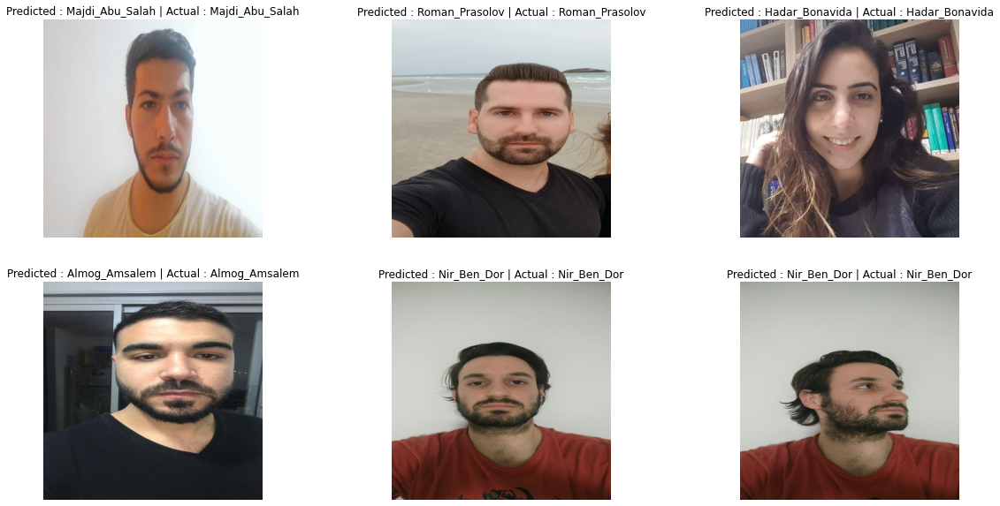

In [ ]:
true_positives_false_negatives(hits_list, all_students, hits_list_label)

#  ResNext- False Negative




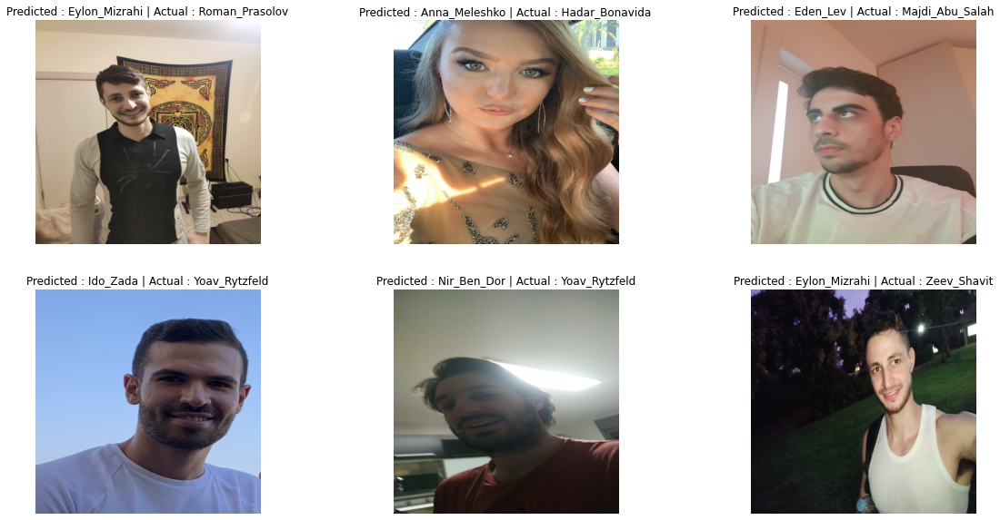

In [ ]:
true_positives_false_negatives(miss_pred_lst, all_students, miss_labels_lst)

# VGG19

In [ ]:
# loss = nn.CrossEntropyLoss()
PATH = '/content/gdrive/My Drive/CV/models/'
vgg19 = models.vgg19(pretrained= True)
vgg19.classifier[6].out_features = 28 #in = 4096
cur_optim = optimizers(vgg19.parameters(),'adam', lr = 1e-4, weight_decay=1e-4)
FL_loss = MyFocalLoss(alpha=0.25 ,gamma=4)
scheduler = optim.lr_scheduler.StepLR(cur_optim, step_size=7, gamma=0.1)
loss_list1, accur_lst1 , val_loss_list, val_acc_list, best_model = training_loop(train_loader ,val_loader, vgg19 , cur_optim, FL_loss, scheduler)
torch.save(best_model, PATH + 'vgg19')

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/checkpoints/vgg19-dcbb9e9d.pth



Validation:[1,     1] train_loss: 1.215747225631788, train_accuracy: 0.046117
Validation:[1,     1] val_loss: 0.765749273092850, val_accuracy: 0.108696



Validation:[2,     2] train_loss: 0.640757270519016, train_accuracy: 0.184466
Validation:[2,     2] val_loss: 0.469025620947713, val_accuracy: 0.347826



Validation:[3,     3] train_loss: 0.351375986360809, train_accuracy: 0.385922
Validation:[3,     3] val_loss: 0.371944091890169, val_accuracy: 0.326087



Validation:[4,     4] train_loss: 0.128140173201422, train_accuracy: 0.599515
Validation:[4,     4] val_loss: 0.079487550543095, val_accuracy: 0.652174



Validation:[5,     5] train_loss: 0.068199682176041, train_accuracy: 0.703883
Validation:[5,     5] val_loss: 0.033792039865385, val_accuracy: 0.760870



Validation:[6,     6] train_loss: 0.014019083197038, train_accuracy: 0.817961
Validation:[6,     6] val_loss: 0.022843298626274, val_accuracy: 0.695652



Validation:[7,     7] train_loss: 0.004842359956438, train_accuracy: 0.866505
Validation:[7,     7] val_loss: 0.020513882961772, val_accuracy: 0.760870



Validation:[8,     8] train_loss: 0.003392072189527, train_accuracy: 0.902913
Validation:[8,     8] val_loss: 0.005260623044982, val_accuracy: 0.847826



Validation:[9,     9] train_loss: 0.000678130532981, train_accuracy: 0.934466
Validation:[9,     9] val_loss: 0.013545958340451, val_accuracy: 0.804348



Validation:[10,    10] train_loss: 0.001153674321168, train_accuracy: 0.927184
Validation:[10,    10] val_loss: 0.027334713700997, val_accuracy: 0.847826



Validation:[11,    11] train_loss: 0.000424437362909, train_accuracy: 0.939320
Validation:[11,    11] val_loss: 0.004155329129983, val_accuracy: 0.869565



Validation:[12,    12] train_loss: 0.000525824198305, train_accuracy: 0.941748
Validation:[12,    12] val_loss: 0.005757976677674, val_accuracy: 0.826087



Validation:[13,    13] train_loss: 0.000895433019399, train_accuracy: 0.915049
Validation:[13,    13] val_loss: 0.002087016832893, val_accuracy: 0.891304



Validation:[14,    14] train_loss: 0.001386498184843, train_accuracy: 0.927184
Validation:[14,    14] val_loss: 0.015687229253514, val_accuracy: 0.847826



Validation:[15,    15] train_loss: 0.000248570067685, train_accuracy: 0.951456
Validation:[15,    15] val_loss: 0.007896220109061, val_accuracy: 0.891304



Validation:[16,    16] train_loss: 0.000152027517197, train_accuracy: 0.946602
Validation:[16,    16] val_loss: 0.002636110470833, val_accuracy: 0.847826



Validation:[17,    17] train_loss: 0.000329744736859, train_accuracy: 0.953883
Validation:[17,    17] val_loss: 0.002451921706898, val_accuracy: 0.891304



Validation:[18,    18] train_loss: 0.000131963316557, train_accuracy: 0.968447
Validation:[18,    18] val_loss: 0.013377294088613, val_accuracy: 0.847826



Validation:[19,    19] train_loss: 0.000288228798718, train_accuracy: 0.953883
Validation:[19,    19] val_loss: 0.001468758554319, val_accuracy: 0.869565



Validation:[20,    20] train_loss: 0.000642835395772, train_accuracy: 0.944175
Validation:[20,    20] val_loss: 0.008815790804953, val_accuracy: 0.869565



In [ ]:
loss, accur,  hits_list, hits_list_label, miss_pred_lst, miss_labels_lst = test(test_loader, best_model, FL_loss)

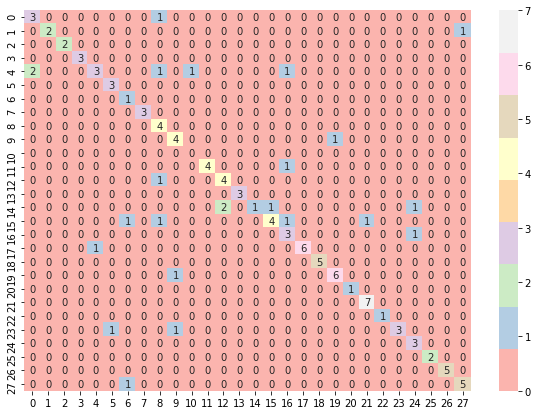

Accuracy of the network on the test images: 79.130 %


In [ ]:
show_scores(best_model.to(device), test_loader)

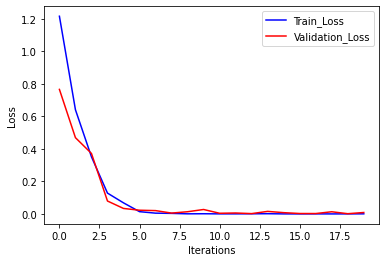

In [ ]:
plt.plot(loss_list1, 'b')
plt.plot(val_loss_list, 'r')
plt.legend(('Train_Loss', 'Validation_Loss'), loc='upper right')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

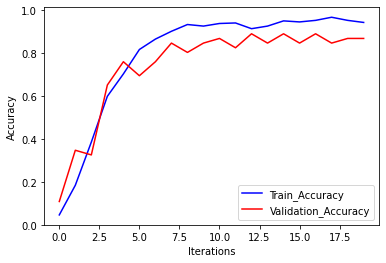

In [ ]:
plt.plot(accur_lst1,'b')
plt.plot(val_acc_list,'r')
plt.legend(('Train_Accuracy', 'Validation_Accuracy'), loc='lower right')
plt.xlabel('Iterations')
plt.ylabel('Accuracy')
plt.show()

#  VGG19- True Positive


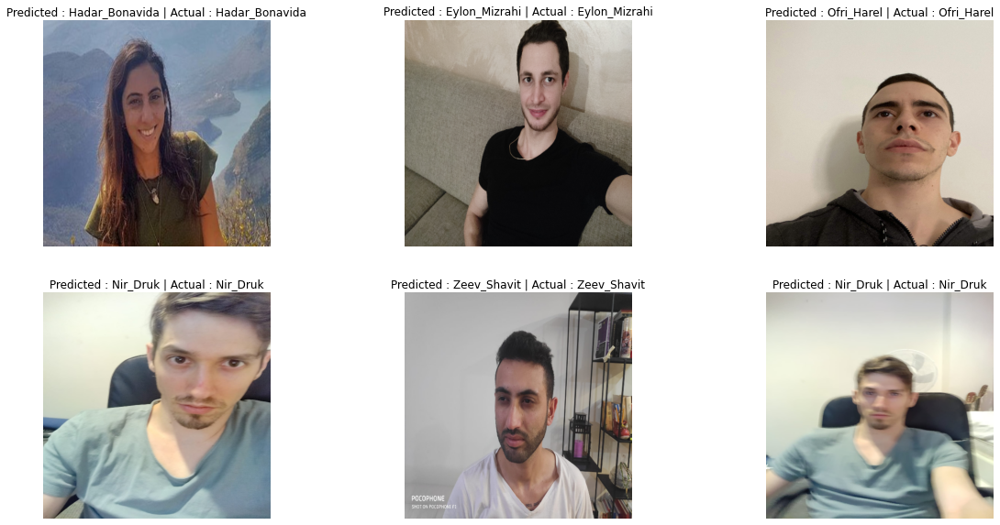

In [ ]:
true_positives_false_negatives(hits_list, all_students, hits_list_label)

#  VGG19- False Negative

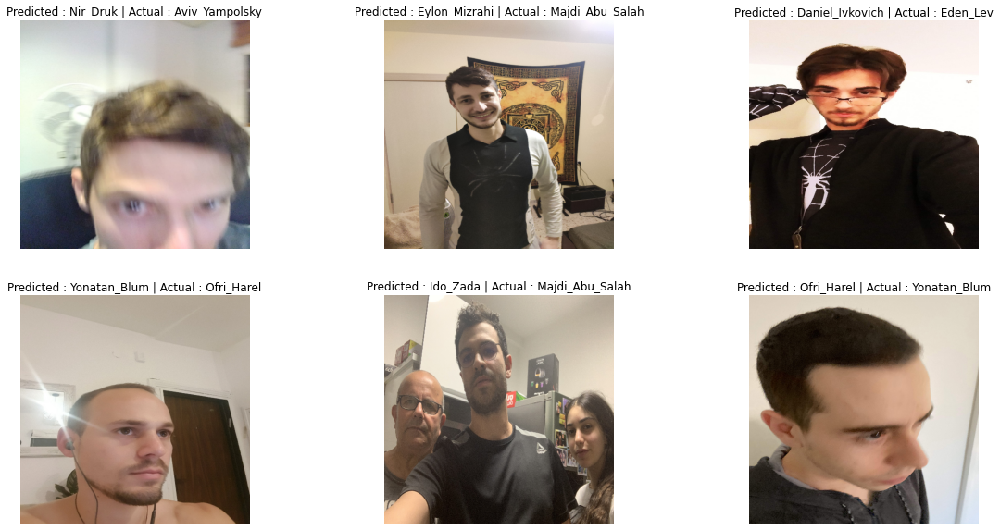

In [ ]:
true_positives_false_negatives(miss_pred_lst, all_students, miss_labels_lst)

# Ensamble

In [ ]:
class MyEnsemble(nn.Module):
    def __init__(self, resnet_m, vgg19_m, densenet_m, googlenet_m, resnext50_m, num_classes):
        super(MyEnsemble,self).__init__()
        self.resnet_m = resnet_m 
        self.vgg19_m  = vgg19_m
        self.densenet_m = densenet_m 
        self.googlenet_m  = googlenet_m
        self.resnext50_m  = resnext50_m

        self.classifier = nn.Linear((self.resnet_m.fc.in_features +
                                     self.vgg19_m.classifier[6].in_features +
                                     self.densenet_m.classifier.in_features+
                                     self.googlenet_m.fc.in_features+
                                     self.resnext50_m.fc.in_features), num_classes)
        
        #Remove the Last layer
        self.resnet_m.fc = nn.Identity() 
        self.vgg19_m.classifier[6] = nn.Identity() 
        self.densenet_m.classifier= nn.Identity() 
        self.googlenet_m.fc  = nn.Identity()
        self.resnext50_m.fc = nn.Identity() 
       
      
    def forward(self, x):
        x1 = self.resnet_m(x.clone())  # clone to make sure x is not changed by inplace methods
        x1 = x1.view(x1.size(0), -1)
        
        x2 = self.vgg19_m(x)
        x2 = x2.view(x2.size(0), -1)
        
        x3 = self.densenet_m(x)
        x3 = x3.view(x3.size(0), -1)
        
        x4 = self.googlenet_m(x)
        x4 = x4.view(x4.size(0), -1)
        
        x5 = self.resnext50_m(x)
        x5 = x5.view(x5.size(0), -1)
        
        #final
        x = torch.cat((x1, x2, x3, x4, x5), dim=1)
        x = self.classifier(F.relu(x))
        
        return x

In [ ]:
def freeze_models(model):
    for param in model.parameters():
        param.requires_grad_(False)

In [ ]:
resnet = models.resnet50(pretrained= True)
vgg19 = models.vgg19(pretrained= True)
densenet = models.densenet161(pretrained= True)
googlenet = models.googlenet(pretrained= True)
resnext50 = models.resnext50_32x4d(pretrained= True)

resnet.fc.out_features = 28 #in = 2048
vgg19.classifier[6].out_features = 28 #in = 4096
densenet.classifier.out_features = 28 #in = 2208
googlenet.fc.out_features = 28 #in = 1024
resnext50.fc.out_features = 28 # in = 2048

vgg19 = torch.load(PATH + 'vgg19')
resnet = torch.load(PATH + 'resnet')
densenet = torch.load(PATH + 'densenet')
googlenet = torch.load(PATH + 'googlenet')
resnext50 = torch.load(PATH + 'resnext50')

freeze_models(resnet)
freeze_models(vgg19)
freeze_models(densenet)
freeze_models(googlenet)
freeze_models(resnext50)

In [ ]:
my_ensamble = MyEnsemble(resnet_m=resnet, vgg19_m=vgg19, densenet_m=densenet, googlenet_m=googlenet, resnext50_m=resnext50, num_classes=28)

In [ ]:
my_ensamble.to(device)

In [ ]:
cur_optim = optimizers(my_ensamble.parameters(),'adam', lr = 1e-4, weight_decay=1e-4)
FL_loss = MyFocalLoss(alpha=0.25 ,gamma=2)
scheduler = optim.lr_scheduler.StepLR(cur_optim, step_size=7, gamma=0.1)
loss_list1, accur_lst1 , val_loss_list, val_acc_list, best_model = training_loop(train_loader ,val_loader, my_ensamble , cur_optim, FL_loss, scheduler)


Validation:[1,     1] train_loss: 0.576463566532413, train_accuracy: 0.351942
Validation:[1,     1] val_loss: 0.259834091300550, val_accuracy: 0.869565



Validation:[2,     2] train_loss: 0.145587207044213, train_accuracy: 0.912621
Validation:[2,     2] val_loss: 0.069294367957374, val_accuracy: 0.934783



Validation:[3,     3] train_loss: 0.037438462714402, train_accuracy: 0.987864
Validation:[3,     3] val_loss: 0.027711096179226, val_accuracy: 0.978261



Validation:[4,     4] train_loss: 0.017684919470288, train_accuracy: 0.997573
Validation:[4,     4] val_loss: 0.022286902951158, val_accuracy: 0.978261



Validation:[5,     5] train_loss: 0.011390228050499, train_accuracy: 0.992718
Validation:[5,     5] val_loss: 0.015834448373188, val_accuracy: 0.978261



Validation:[6,     6] train_loss: 0.007939107083146, train_accuracy: 0.997573
Validation:[6,     6] val_loss: 0.014653784911270, val_accuracy: 0.978261



Validation:[7,     7] train_loss: 0.005949378863556, train_accuracy: 0.997573
Validation:[7,     7] val_loss: 0.013330700523827, val_accuracy: 0.978261



Validation:[8,     8] train_loss: 0.004871911877875, train_accuracy: 0.997573
Validation:[8,     8] val_loss: 0.014768133790273, val_accuracy: 0.934783



Validation:[9,     9] train_loss: 0.005307786234483, train_accuracy: 0.992718
Validation:[9,     9] val_loss: 0.012510079809505, val_accuracy: 0.956522



Validation:[10,    10] train_loss: 0.005029187836115, train_accuracy: 0.997573
Validation:[10,    10] val_loss: 0.012715118410795, val_accuracy: 0.956522



Validation:[11,    11] train_loss: 0.005042067733458, train_accuracy: 0.997573
Validation:[11,    11] val_loss: 0.014285076935978, val_accuracy: 0.913043



Validation:[12,    12] train_loss: 0.004740384628870, train_accuracy: 1.000000
Validation:[12,    12] val_loss: 0.014303414070088, val_accuracy: 0.978261



Validation:[13,    13] train_loss: 0.004623539754850, train_accuracy: 0.997573
Validation:[13,    13] val_loss: 0.011141400014901, val_accuracy: 0.956522



Validation:[14,    14] train_loss: 0.004435690497365, train_accuracy: 1.000000
Validation:[14,    14] val_loss: 0.010535123768141, val_accuracy: 0.956522



Validation:[15,    15] train_loss: 0.003750237927872, train_accuracy: 0.997573
Validation:[15,    15] val_loss: 0.012334260218979, val_accuracy: 0.978261



Validation:[16,    16] train_loss: 0.004524567392790, train_accuracy: 1.000000
Validation:[16,    16] val_loss: 0.012527172858624, val_accuracy: 0.956522



Validation:[17,    17] train_loss: 0.004151002408991, train_accuracy: 0.997573
Validation:[17,    17] val_loss: 0.011091907690887, val_accuracy: 0.934783



Validation:[18,    18] train_loss: 0.004308773136870, train_accuracy: 1.000000
Validation:[18,    18] val_loss: 0.010197278638573, val_accuracy: 0.978261



Validation:[19,    19] train_loss: 0.004464377282929, train_accuracy: 0.995146
Validation:[19,    19] val_loss: 0.009626494973655, val_accuracy: 0.978261



Validation:[20,    20] train_loss: 0.004672997151908, train_accuracy: 1.000000
Validation:[20,    20] val_loss: 0.010324836668113, val_accuracy: 0.956522



In [ ]:
loss, accur,  hits_list, hits_list_label, miss_pred_lst, miss_labels_lst = test(test_loader, best_model, FL_loss)

In [ ]:
len(hits_list)

107

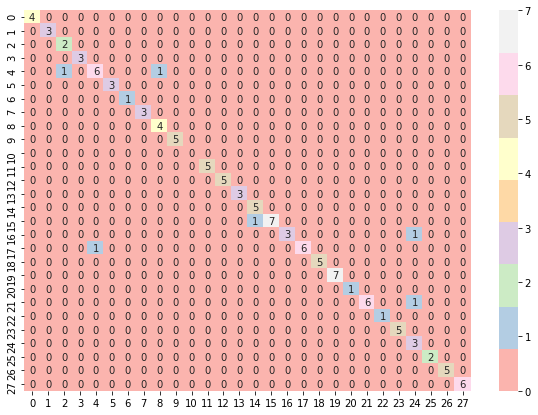

Accuracy of the network on the test images: 94.783 %


In [ ]:
show_scores(best_model.to(device), test_loader)

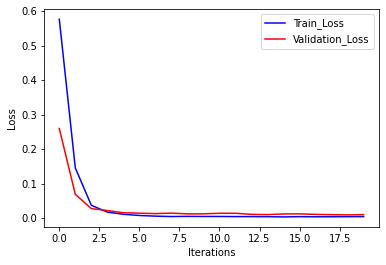

In [ ]:
plt.plot(loss_list1, 'b')
plt.plot(val_loss_list, 'r')
plt.legend(('Train_Loss', 'Validation_Loss'), loc='upper right')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

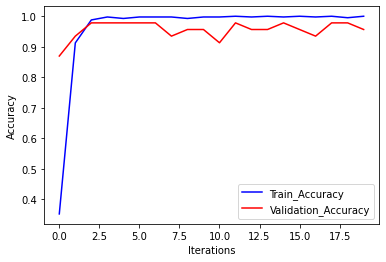

In [ ]:
plt.plot(accur_lst1,'b')
plt.plot(val_acc_list,'r')
plt.legend(('Train_Accuracy', 'Validation_Accuracy'), loc='lower right')
plt.xlabel('Iterations')
plt.ylabel('Accuracy')
plt.show()

# Ensemble - True Positive

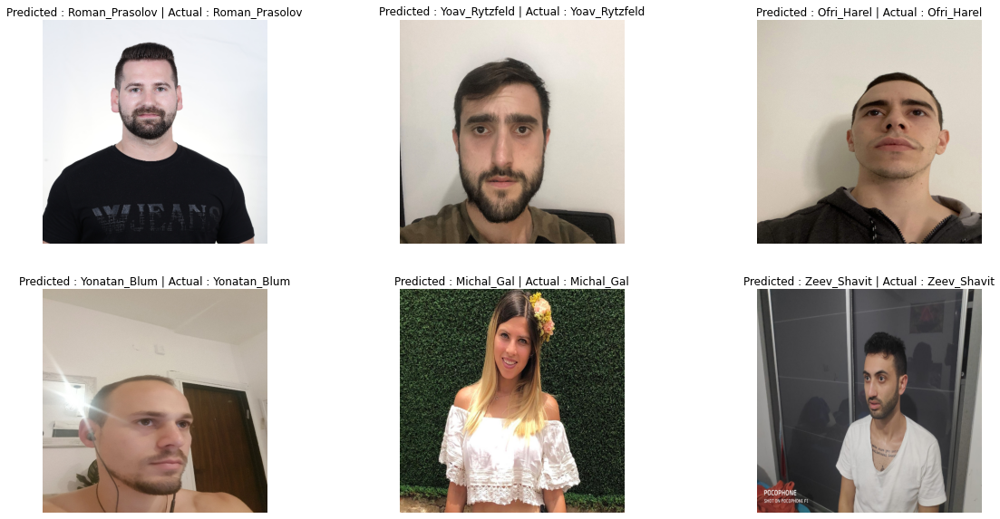

In [ ]:
true_positives_false_negatives(hits_list, all_students, hits_list_label)

# Ensemble - False Negative

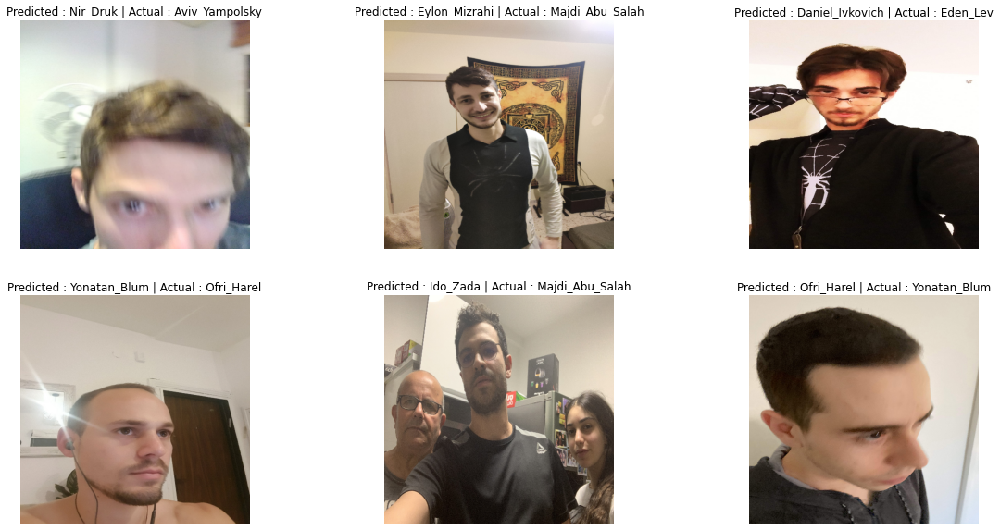

In [ ]:
true_positives_false_negatives(miss_pred_lst, all_students, miss_labels_lst)

# 2.Final report -summarize all the work


Following the last assigment of building the dataloader for the face recognition, we asked to train diffrent models by using the tools we build there.
In this part i will explain about all the parts of the assignment.
1. VGG16 implemantation +  data loader.
2. Choose optimizer, and write the training loop
3. +4+5. Vizualization - Graphs, Confusion Matrix, True/False examples.
4. Load ImageNet models and train them on our data + vizualization for each model.
5. Integrate all the models( create Ensamble) -  and train our data on the ensamble + show better results.
6. Results comprasions

1.1 DataLoader - In this part i used the dataset that i built in the last assigment, the class called "MyDataSet" and this class using augmantations, i tried many augmanatations with many paramaters, and in the end i chose those who gave me the best results while training the data.
I showed the selected augmantations on single batch to show that they not ruin the data.
In addition, i realized that the face detecter that i used in te last assigments was not so good, and didnt find all the faces in all images, which giving us less data to train on, so i decided to try another face detector and used the one called 'caffeModel' which i took from [https://www.pyimagesearch.com/2018/09/24/opencv-face-recognition/](https://www.pyimagesearch.com/2018/09/24/opencv-face-recognition/), and the model from [https://github.com/thegopieffect/computer_vision/raw/master/CAFFE_DNN/res10_300x300_ssd_iter_140000.caffemodel](https://github.com/thegopieffect/computer_vision/raw/master/CAFFE_DNN/res10_300x300_ssd_iter_140000.caffemodel 
).Its helped me solve this problem, and i only nedded to take off from the data 4 images thats the classifier couldn't detect, like images that some students put an hand on their face, or very dark images that couldn't be recognized.
after the detcetion i cropped the images in order to have images only with faces, without noise. without making the preprocessing on the data, the model will have poor performance. 

1.2 VGG16 model - i used [https://neurohive.io/en/popular-networks/vgg16/](https://neurohive.io/en/popular-networks/vgg16/) to better understand the architechture of vgg16 model and to understand how exactly to build it.

2.optimizers - i tried to work with few optimizers 'Adam' and 'Radam'.
and found that 'Radam' worked better for vgg model with learning rate of 1e-4. I also added weight decay paramter which gives better results, and another thing that imporved my results was the scheduler that i used in all the models, every time with other paramter of step size that i chose due to the overfitting. 
as well i worked with 2 loss functions :
1. Focal Loss
2. Cross Entropy


3.Vizualization - I showed my results with graphs and confusion matrix from sklearn library and pyhroch tutorial that helped me to implement that.[https://pytorch.org/tutorials/beginner/transfer_learning_tutorial.html](https://pytorch.org/tutorials/beginner/transfer_learning_tutorial.html).
As well i showed examples where the model detect the face right, and when wrong.

4.ImageNet models -Its a trained models library of Torchvision, where all the models trained on thousands of ImageNet images.  I didnt have a specific preference for choosing the models, i tried few models, and chose the one who gave me the best results.
In each model i worked with another parameters , optimizers and losses.
- for ResNet model - Adam and Focal Loss worked well for me, with learning rate of 1e-4 and weight decay of the same parameter, and alpha = 0.25, gamma=2 in the loss.
- for DenseNet model -  i used Adam and Focal Loss with learning rate of 1e-4, and changed the gamma for 4.
- for GoogleNet model - i used Adam and Focal Loss with learning rate of 1e-3 and weight decay of 1e-4.
- for VGG19 model  -  i used Adam and Focal Loss  with LR and WD of 1e-4.
- for ResNext model - i used adam and FocalLoss with LR od 1e-4 and WD of 1e-5


5.Ensamble - for the Ensamble class i used [https://discuss.pytorch.org/t/custom-ensemble-approach/52024/8](https://discuss.pytorch.org/t/custom-ensemble-approach/52024/8) to understand how to build and use it.
I understood that in order to create an ensamble that fits our data, first of all i must change the output layer of each model to the number of our classes(28) to match the saved model, to connect all the models i removed the last layer of each model and replaced it with identity layer.
For prediction i passed the input on each model and i connected the output of each model to the last output layer. 
The in features of the last layer is the sum of the in features of all the models.


6. Results comprasions between ensemble and each model seperatly - The result on easch model was:

1. ResNet - Test Accuracy : 93.043%
2. Densenet - Test Accuracy : 93.913%
3. vgg19 - Test Accuracy : 93.043%
4. resnext50 - Test Accuracy : 82.609%
5. googlenet - Test Accuracy : 79.130%

The results on the ensamble were: Test Accuracy: 94.783 %

we can see that we got better results on the ensamble than on each model seperatly.

### The images that i removed from the student list, which the face detector couldnt recognize

In [ ]:
removed_images= []
removed_images.append('/content/gdrive/My Drive/ImagesCV/Zeev_Shavit/zeev 22.jpeg')
removed_images.append('/content/gdrive/My Drive/ImagesCV/Zeev_Shavit/zeev 19.jpeg')
removed_images.append('/content/gdrive/My Drive/ImagesCV/Aviv_Yampolsky/IMG_20200518_211458.jpg')
removed_images.append('/content/gdrive/My Drive/ImagesCV/Yigal_Diker/image2.jpeg')

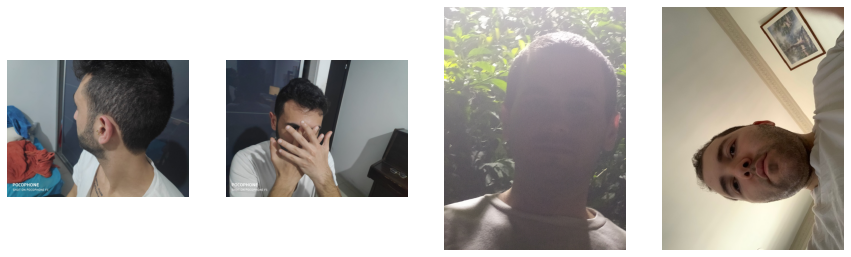

In [ ]:
plt.figure(figsize=[15, 10])
for idx,img in enumerate(removed_images):
    image = cv2.imread(img)
    image = cv2.cvtColor(image,cv2.COLOR_RGB2BGR)
    plt.subplot(1,4,idx +1)
    plt.imshow(image)
    plt.axis('off')
plt.show()